In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
from surprise import KNNWithMeans
import numpy as np
from sklearn.neighbors import NearestNeighbors
from surprise import Dataset
from sklearn.metrics.pairwise import pairwise_distances
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import re
import seaborn as sns

from sklearn import datasets
from surprise import SVD,Dataset,Reader
from surprise import accuracy
from sklearn.metrics import mean_squared_error
from math import sqrt

In [48]:
df = pd.read_csv("ratings_Electronics.csv")

In [49]:
df.columns = ['userId', 'productId', 'Rating', 'timestamp']

In [50]:
df.head()

,userId,productId,Rating,timestamp
0,A2CX7LUOHB2NDG,0321732944,5.0,1341100800
1,A2NWSAGRHCP8N5,0439886341,1.0,1367193600
2,A2WNBOD3WNDNKT,0439886341,3.0,1374451200
3,A1GI0U4ZRJA8WN,0439886341,1.0,1334707200
4,A1QGNMC6O1VW39,0511189877,5.0,1397433600


In [51]:
df.shape

(7824481, 4)

In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7824481 entries, 0 to 7824480
Data columns (total 4 columns):
userId       object
productId    object
Rating       float64
timestamp    int64
dtypes: float64(1), int64(1), object(2)
memory usage: 238.8+ MB


In [53]:
df.describe

<bound method NDFrame.describe of                  userId   productId  Rating   timestamp
0        A2CX7LUOHB2NDG  0321732944     5.0  1341100800
1        A2NWSAGRHCP8N5  0439886341     1.0  1367193600
2        A2WNBOD3WNDNKT  0439886341     3.0  1374451200
3        A1GI0U4ZRJA8WN  0439886341     1.0  1334707200
4        A1QGNMC6O1VW39  0511189877     5.0  1397433600
...                 ...         ...     ...         ...
7824476  A2YZI3C9MOHC0L  BT008UKTMW     5.0  1396569600
7824477  A322MDK0M89RHN  BT008UKTMW     5.0  1313366400
7824478  A1MH90R0ADMIK0  BT008UKTMW     4.0  1404172800
7824479  A10M2KEFPEQDHN  BT008UKTMW     4.0  1297555200
7824480  A2G81TMIOIDEQQ  BT008V9J9U     5.0  1312675200

[7824481 rows x 4 columns]>

(array([ 901765.,       0.,  456322.,       0.,       0.,  633073.,
              0., 1485781.,       0., 4347540.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <a list of 10 Patch objects>)

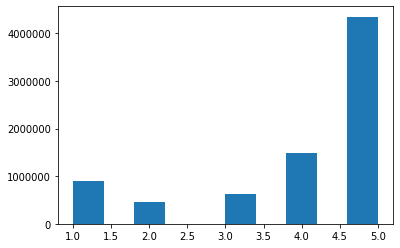

In [54]:
plt.hist(df.Rating)

In [56]:
df.drop(columns={"timestamp"}, inplace=True)

In [57]:
df.head()

,userId,productId,Rating
0,A2CX7LUOHB2NDG,0321732944,5.0
1,A2NWSAGRHCP8N5,0439886341,1.0
2,A2WNBOD3WNDNKT,0439886341,3.0
3,A1GI0U4ZRJA8WN,0439886341,1.0
4,A1QGNMC6O1VW39,0511189877,5.0


In [58]:
counts = df['userId'].value_counts()
df = df[df['userId'].isin(counts[counts >= 50].index)]

In [59]:
df.shape

(125871, 3)

In [60]:
from sklearn.model_selection import train_test_split
train_data, test_data = train_test_split(df, test_size = 0.30, random_state=1)

In [402]:
train_data_grouped = train_data.groupby('productId')['Rating'].mean().sort_values(ascending=False).head()  
popularity_recommendations=train_data_grouped.head()
popularity_recommendations

productId
B00LKG1MC8    5.0
B002P5DNY8    5.0
B002P3KMVC    5.0
B002P3KMXA    5.0
B002P3KMXU    5.0
Name: Rating, dtype: float64

In [62]:
def recommend(user_id):     
    user_recommendations = popularity_recommendations 
    user_recommendations['userId'] = user_id 
    return user_recommendations 

In [63]:
for i in test_data["userId"]:
    print("Here is the recommendation for the user Id : %s\n" %i)
    print(recommend(i))
    print("\n") 

Here is the recommendation for the user Id : A2CIQEY05SPHTZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2CIQEY05SPHTZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A370XYLIZCSK1Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A370XYLIZCSK1Y
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANTN61S4L7WG9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANTN61S4L7WG9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HPJKM7L4EOQB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA              

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KWPIORLG2QV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1KWPIORLG2QV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LF16F0KX9L7P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2LF16F0KX9L7P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1NGFGBX2VCQS8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1NGFGBX2VCQS8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OYO7B6SS7QLH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VQHH85U7PX0

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1VQHH85U7PX0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2W9I628I6SE1U

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2W9I628I6SE1U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VODABWSVHV8E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VODABWSVHV8E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QQCEQ33O0GJU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A13WREJ05GMRA6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A13WREJ05GMRA6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SKEQT0WTB954

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2SKEQT0WTB954
Name: Rating, dtype: object


Here is the recommendation for the user Id : A13EQE9EY2ET93

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A13EQE9EY2ET93
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SQCTNYQFVBWM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A6FIAB28IS79

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        A6FIAB28IS79
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZA5SXZS8Z3CK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZA5SXZS8Z3CK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19X4BF861LQST

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19X4BF861LQST
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2DIQTZPF26T1L

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3VC74TJ06WDDD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3VC74TJ06WDDD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A7FDGFK0KN7QG

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A7FDGFK0KN7QG
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1OO9N1MRNQ7K0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1OO9N1MRNQ7K0
Name: Rating, dtype: object


Here is the recommendation for the user Id : AEAFHD09X8044

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1E55W6ES0FY17

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1E55W6ES0FY17
Name: Rating, dtype: object


Here is the recommendation for the user Id : A21T0D2F7SKG5S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A21T0D2F7SKG5S
Name: Rating, dtype: object


Here is the recommendation for the user Id : AY3D7DG5L5WCK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AY3D7DG5L5WCK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1N5FSCYN4796F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2IT7S59GSASN7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2IT7S59GSASN7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2THQCHKR89E16

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2THQCHKR89E16
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZA5SXZS8Z3CK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZA5SXZS8Z3CK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A26BDXG9KVH7SU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2OWR5G2OAQF7C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2OWR5G2OAQF7C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A18EA7MNLXP9H5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A18EA7MNLXP9H5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ZY3S7SD3QO8Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ZY3S7SD3QO8Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10NMELR4KX0J6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FLJCHN5CG5M5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1FLJCHN5CG5M5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AZ515FFZ7I2P7

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AZ515FFZ7I2P7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1SHHQSPOWR00F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1SHHQSPOWR00F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3F9CBHV4OHFBS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AGVWTYW0ULXHT

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGVWTYW0ULXHT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A21VM9WVF8EOSJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A21VM9WVF8EOSJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : AZAC8O310IK4E

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AZAC8O310IK4E
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANTN61S4L7WG9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P



Here is the recommendation for the user Id : A2EF8N7ZE7ONWX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2EF8N7ZE7ONWX
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYB4ELCS5AM8P

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AYB4ELCS5AM8P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F1A0QQP2XVH5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1F1A0QQP2XVH5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3IOQ7NVVLAUEE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA            

Here is the recommendation for the user Id : APQQK1V695AUE

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        APQQK1V695AUE
Name: Rating, dtype: object


Here is the recommendation for the user Id : AN81JUYW2SL24

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AN81JUYW2SL24
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2I5LVVQ7WXEH6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2I5LVVQ7WXEH6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2KYRPDKVBI2R4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B0

Name: Rating, dtype: object


Here is the recommendation for the user Id : AMZCZBK1EF1PV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMZCZBK1EF1PV
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQ2FC1DLKVD8H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQ2FC1DLKVD8H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A680RUE1FDO8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A680RUE1FDO8B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A274MXTX3DYLUV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM



Here is the recommendation for the user Id : A95PWI4S6WHGL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A95PWI4S6WHGL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35A2RWUMC737N

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A35A2RWUMC737N
Name: Rating, dtype: object


Here is the recommendation for the user Id : AK3GKIV8DEY8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AK3GKIV8DEY8B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33XMCG1UFDSY2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5


Name: Rating, dtype: object


Here is the recommendation for the user Id : A19W47CXJJP1MI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19W47CXJJP1MI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1N5FSCYN4796F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1N5FSCYN4796F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3LQUEB84IR3VO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3LQUEB84IR3VO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A13BX9O5UDBILC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3JUHP1E3WUHEA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3JUHP1E3WUHEA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PDWA32BAMB2Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PDWA32BAMB2Y
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25QJBK33C4O0R

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25QJBK33C4O0R
Name: Rating, dtype: object


Here is the recommendation for the user Id : AAA0TUKS5VBSA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A38RMU1Y5TDP9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A38RMU1Y5TDP9
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABQWMANK4AR63

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABQWMANK4AR63
Name: Rating, dtype: object


Here is the recommendation for the user Id : A84FLVDK2R5JF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A84FLVDK2R5JF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZVFCPHCWFV71

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1S7BFT0HDF3HA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1S7BFT0HDF3HA
Name: Rating, dtype: object


Here is the recommendation for the user Id : ACJT8MUC0LRF0

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ACJT8MUC0LRF0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A213J54E63SYOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A213J54E63SYOP
Name: Rating, dtype: object


Here is the recommendation for the user Id : AHNHLGKIZ2N3B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AY4YUOX2N1BQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2AY4YUOX2N1BQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A18U49406IPPIJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A18U49406IPPIJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3H4S6YO9VNGDZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3H4S6YO9VNGDZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A231WM2Z2JL0U3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2V9DTXTQ5YIMK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2V9DTXTQ5YIMK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3BACUOZV1M0WM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3BACUOZV1M0WM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27M75LRSJ788H

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27M75LRSJ788H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A213J54E63SYOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A12DQZKRKTNF5E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A12DQZKRKTNF5E
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYO1146CBIV5C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AYO1146CBIV5C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11T807LX2EF00

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11T807LX2EF00
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PD8JD9L4WEII

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WB7LZ595CR50

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WB7LZ595CR50
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3284KYDZ00BZA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3284KYDZ00BZA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FDV3WPOHREY9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1FDV3WPOHREY9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ME89MSWVG9NF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A33HIV8RXRDM88

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A33HIV8RXRDM88
Name: Rating, dtype: object


Here is the recommendation for the user Id : A6FIAB28IS79

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        A6FIAB28IS79
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20H1M28WLI9J2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20H1M28WLI9J2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F9Z42CFF9IAY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3Q4TYJVAM4IRM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33ZYFE8XMKKR1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A33ZYFE8XMKKR1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2GKMXRLI7KLFP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2GKMXRLI7KLFP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1HFT68GJ42LTM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1HFT6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3MFORLOKIOEQY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2DG63DN704LOI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2DG63DN704LOI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A357B3PUHSVQA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A357B3PUHSVQA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1PN2U0AWXGVML

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1PN2U0AWXGVM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2CWIYIETNBAK3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2CWIYIETNBAK3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LF16F0KX9L7P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2LF16F0KX9L7P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3MMR2WDKAK0PA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3MMR2WDKAK0PA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QNQQKJTL76H0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3FEGTOLCWXSV4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3FEGTOLCWXSV4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A22I55P15NSAOX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A22I55P15NSAOX
Name: Rating, dtype: object


Here is the recommendation for the user Id : AROQO2VDODT7

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        AROQO2VDODT7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A15T9G38F589KM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A35SNSDRNE9P8Q

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A35SNSDRNE9P8Q
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1A306IAZ3TM1

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1A306IAZ3TM1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A680RUE1FDO8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A680RUE1FDO8B
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADKZOXAOV8EXD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P


productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGOH8N902URMW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A259MPG6SOL02P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A259MPG6SOL02P
Name: Rating, dtype: object


Here is the recommendation for the user Id : AG2YXYIQ8TLTA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AG2YXYIQ8TLTA
Name: Rating, dtype: object


Here is the recommendation for the user Id : ATFBVUXDIRXT6

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ATFBVUXDIRXT6
Name: Rati

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1H55L0BLPCWYF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U5NWJOYH2QQH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1U5NWJOYH2QQH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1OMXVXXP07F05

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1OMXVXXP07F05
Name: Rating, dtype: object


Here is the recommendation for the user Id : A23WPWLYT3P1CZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A23WPW

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1K4G5YJDJQI6Q

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1K4G5YJDJQI6Q
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABSYIF0ONC2AF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABSYIF0ONC2AF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QRW0UJPKIAX7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QRW0UJPKIAX7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FLJCHN5CG5M5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A6XLG77BC9R8R

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A6XLG77BC9R8R
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WF58BAWLVI95

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WF58BAWLVI95
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V7D0LH8L7BG0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3V7D0LH8L7BG0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PCEB9ND82AGE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A5JLAU2ARJ0BO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5JLAU2ARJ0BO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3NG7X4APIV649

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3NG7X4APIV649
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGOH8N902URMW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGOH8N902URMW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A22CW0ZHY3NJH8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : ADLVFFE4VBT8

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        ADLVFFE4VBT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1P4XD7IORSEFN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1P4XD7IORSEFN
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGHZXQL9F94T9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGHZXQL9F94T9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ODOGXEYECQQ8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A267FU71Z01CIH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A267FU71Z01CIH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EX8ZFNVDHGPM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3EX8ZFNVDHGPM
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABUE0ALHKWKHC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABUE0ALHKWKHC
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARIDN94LOCQFD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AZOK5STV85FBJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A16SRDVPBXN69C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A16SRDVPBXN69C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10NMELR4KX0J6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10NMELR4KX0J6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3VTOLNB5N6FVP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3VTOLNB5N6F

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1J75JJ0Q2OEJN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1J75JJ0Q2OEJN
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2DXENZNO2JT4F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2DXENZNO2JT4F
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADZF3QDGSZE7K

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ADZF3QDGSZE7K
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11OTLEDSW8ZXD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1AH8033GWKBY7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1AH8033GWKBY7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10NMELR4KX0J6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10NMELR4KX0J6
Name: Rating, dtype: object


Here is the recommendation for the user Id : AC9QEWWN4W9MC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AC9QEWWN4W9MC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A253IOATGMT2UP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPODHOB4GFWL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWPODHOB4GFWL
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABIVKBMSIPEDY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABIVKBMSIPEDY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2H4OMJLE7JFM2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2H4OMJLE7JFM2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RIXSMGE9VIBG

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A33HIV8RXRDM88

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A33HIV8RXRDM88
Name: Rating, dtype: object


Here is the recommendation for the user Id : AOWF9T81XMX2S

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AOWF9T81XMX2S
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2W9GX82SLKROQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2W9GX82SLKROQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : AT8V3JOZD3KWK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A11R5VW7IM6ISQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11R5VW7IM6ISQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XIOXRRYX0KZY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2XIOXRRYX0KZY
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADLVFFE4VBT8

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        ADLVFFE4VBT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3H4S6YO9VNGDZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A24P4E3RJ6AX94

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A24P4E3RJ6AX94
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JMJVNTBL7K7E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2JMJVNTBL7K7E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1P3DDFL423B3C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1P3DDFL423B3C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25HBO5V8S8SEA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17BUUBOU0598B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NX6PABLIJLP1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NX6PABLIJLP1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F9Z42CFF9IAY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1F9Z42CFF9IAY
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADKZOXAOV8EXD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ADKZOXAOV8EX

Name: Rating, dtype: object


Here is the recommendation for the user Id : AC9QEWWN4W9MC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AC9QEWWN4W9MC
Name: Rating, dtype: object


Here is the recommendation for the user Id : AN81JUYW2SL24

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AN81JUYW2SL24
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKBVYIIHWI04B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKBVYIIHWI04B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QNX5KWHDV0GD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B4MIXYVIKMU2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1B4MIXYVIKMU2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PPO2X5PJE1L9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PPO2X5PJE1L9
Name: Rating, dtype: object


Here is the recommendation for the user Id : AN0JK8OQLUC55

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AN0JK8OQLUC55
Name: Rating, dtype: object


Here is the recommendation for the user Id : ATDQ9CGCWTT8D

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZVFCPHCWFV71

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZVFCPHCWFV71
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1S27P7KJO9I96

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1S27P7KJO9I96
Name: Rating, dtype: object


Here is the recommendation for the user Id : A110VKXAVLAYKY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A110VKXAVLAYKY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VQHH85U7PX0

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : AVSMRPI23DQI2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVSMRPI23DQI2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3HQAPXAJV7PRX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3HQAPXAJV7PRX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1NZLRAZJGD99W

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1NZLRAZJGD99W
Name: Rating, dtype: object


Here is the recommendation for the user Id : A38KK0SZYEH5UD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AMZCZBK1EF1PV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMZCZBK1EF1PV
Name: Rating, dtype: object


Here is the recommendation for the user Id : AFQBS241UKPAZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AFQBS241UKPAZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RGA7UGAN3UL7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RGA7UGAN3UL7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OXHLG6DIBRW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3T4OHEAHOJ700

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3T4OHEAHOJ700
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ER8G4JJJ7XER

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ER8G4JJJ7XER
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25C2M3QF9G7OQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25C2M3QF9G7OQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F1A0QQP2XVH5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A15U64VGUV6RBF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15U64VGUV6RBF
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYGEKID3G7DPW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AYGEKID3G7DPW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A15QYHQH80W30L

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15QYHQH80W30L
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JRDFIGWTX50J

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AG5WSXI52FPKH

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AG5WSXI52FPKH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZPY91VE3IDN1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZPY91VE3IDN1
Name: Rating, dtype: object


Here is the recommendation for the user Id : ASFP250F22MDZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ASFP250F22MDZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10O7THJ2O20AG

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V6QSTG2T9MIO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3V6QSTG2T9MIO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2K5RRMPICZ606

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2K5RRMPICZ606
Name: Rating, dtype: object


Here is the recommendation for the user Id : A680RUE1FDO8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A680RUE1FDO8B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A110PC8C5Y7MQD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WYF4POBUXL2O

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WYF4POBUXL2O
Name: Rating, dtype: object


Here is the recommendation for the user Id : A34VRVI4CSI5RQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34VRVI4CSI5RQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2X61KKXXR6WNP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2X61KKXXR6WNP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2L42QEWR77PKZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : AVFJ327UXPXLF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVFJ327UXPXLF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3MUSWDCTZINQZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3MUSWDCTZINQZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A37PV5GMP2ILJC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A37PV5GMP2ILJC
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGATRDOFW48DK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2F2GLVFRNV7JJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2F2GLVFRNV7JJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : AMRMK86X3PKXD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMRMK86X3PKXD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1DO9LRCO23EOM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1DO9LRCO23EOM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11D1KHM7DVOQK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A11I1I9QLMAM1A

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11I1I9QLMAM1A
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKX9EQ37PAYMY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKX9EQ37PAYMY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A377LPVLLAI42D

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A377LPVLLAI42D
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2F7CSE6KT7NI4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AKBVYIIHWI04B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKBVYIIHWI04B
Name: Rating, dtype: object


Here is the recommendation for the user Id : AMO1MLSIJSQOF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMO1MLSIJSQOF
Name: Rating, dtype: object


Here is the recommendation for the user Id : AU3GYRAKBUAEU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AU3GYRAKBUAEU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U5NWJOYH2QQH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1GQRGB8FGSLIZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1GQRGB8FGSLIZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1BJOHHLG0D965

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1BJOHHLG0D965
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2TA40MV2H4O6F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2TA40MV2H4O6F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2OWR5G2OAQF7C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      


productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANW6EGY12V5XS
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARBKYIVNYWK3C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARBKYIVNYWK3C
Name: Rating, dtype: object


Here is the recommendation for the user Id : AOEAD7DPLZE53

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AOEAD7DPLZE53
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11ULAZ4B5ZXC8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11ULAZ4B5ZXC8
Name: Rati

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2YYHSORXIHZCS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2YYHSORXIHZCS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VAD79S4A06DD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VAD79S4A06DD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1GNYV0RA0EQSS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1GNYV0RA0EQSS
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGXMC3ITWZASE

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2UEB48LAWFUCW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2UEB48LAWFUCW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CMD08Z49PGKQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CMD08Z49PGKQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RGWCT6K2C3EZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RGWCT6K2C3EZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ME89MSWVG9NF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZU55TM45Y2R8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZU55TM45Y2R8
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARXU3FESTWMJJ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARXU3FESTWMJJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Y739CRM15WDL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2Y739CRM15WDL
Name: Rating, dtype: object


Here is the recommendation for the user Id : AWSK1ZAEU1KFL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1O229NVVDJUX2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1O229NVVDJUX2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28BX3MM90A6FI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28BX3MM90A6FI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2CL818RN52NWN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2CL818RN52NWN
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3F3B6HY9RJI04

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      


Here is the recommendation for the user Id : A213J54E63SYOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A213J54E63SYOP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1EVV74UQYVKRY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1EVV74UQYVKRY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DDH4NT6Q1E8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20DDH4NT6Q1E8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V0YR50F1XSKP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A6FIAB28IS79

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        A6FIAB28IS79
Name: Rating, dtype: object


Here is the recommendation for the user Id : A250AXLRBVYKB4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A250AXLRBVYKB4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NB2E5DXE319Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NB2E5DXE319Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : A186697K4XKXQL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1GYEGLX3P2Y7P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1GYEGLX3P2Y7P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1A5KUIIIHFF4U

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1A5KUIIIHFF4U
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABDR6IJ93HFIO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABDR6IJ93HFIO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A8X8D4BUY5DFU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : ABXANRX4GPYRZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABXANRX4GPYRZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A15G70V9OBTOVO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15G70V9OBTOVO
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANW6EGY12V5XS

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANW6EGY12V5XS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33HIV8RXRDM88

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1NNMOD9H36Q8E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1NNMOD9H36Q8E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OXHLG6DIBRW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OXHLG6DIBRW8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3S0EHEIR52HP1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3S0EHEIR52HP1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T3S3VTW65VO5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      


Here is the recommendation for the user Id : A2W2ODLRQ2L8LE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2W2ODLRQ2L8LE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Y29IRSI08F0I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2Y29IRSI08F0I
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKBVYIIHWI04B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKBVYIIHWI04B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2KHG3JOFXQ4CE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A16RI68PS6T5CA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A16RI68PS6T5CA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OZA8HNJM26DC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OZA8HNJM26DC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A22I55P15NSAOX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A22I55P15NSAOX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35HUT8MQMT21L

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NJQF2UI60VGT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NJQF2UI60VGT
Name: Rating, dtype: object


Here is the recommendation for the user Id : AEJAGHLC675A7

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AEJAGHLC675A7
Name: Rating, dtype: object


Here is the recommendation for the user Id : AVJORH3ACR2A5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVJORH3ACR2A5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A274MXTX3DYLUV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A16J281SJ9QXIQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A16J281SJ9QXIQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYLLSFYS3UP1H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AYLLSFYS3UP1H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U4GOVZWL8ZTL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1U4GOVZWL8ZTL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A13BX9O5UDBILC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        A5KMMY627T3W
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2D1LPEUCTNT8X

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2D1LPEUCTNT8X
Name: Rating, dtype: object


Here is the recommendation for the user Id : AAR7CEPXYJA0T

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AAR7CEPXYJA0T
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XCCN239AR1XK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2XCCN239AR1XK
Name: Rati

Name: Rating, dtype: object


Here is the recommendation for the user Id : A17O9AHKHK66AI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17O9AHKHK66AI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3D2VIUT2HWP0Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3D2VIUT2HWP0Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1URXSRV6WDHVY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1URXSRV6WDHVY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20H1M28WLI9J2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A335QXPTV1RIV1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A335QXPTV1RIV1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A368IPE6EW0GZL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A368IPE6EW0GZL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A26BDXG9KVH7SU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A26BDXG9KVH7SU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2QNS95WGN35G9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Here is the recommendation for the user Id : A4WEZJOIZIV4U

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A4WEZJOIZIV4U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3BVN2QBNPBHCR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3BVN2QBNPBHCR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3T4OHEAHOJ700

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3T4OHEAHOJ700
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3CP3J7OEGQMD5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA              

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NN1KIYEM2SKS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NN1KIYEM2SKS
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADOR3TR7GDF68

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ADOR3TR7GDF68
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KSNK256G46GX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1KSNK256G46GX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WDCAMKCCP1UR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PICNZWHEINQC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PICNZWHEINQC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19W47CXJJP1MI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19W47CXJJP1MI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A32HSNCNPRUMTR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A32HSNCNPRUMTR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BUQ240COLAOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A27M75LRSJ788H

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27M75LRSJ788H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A87N6UTYA6NOB

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A87N6UTYA6NOB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1UQBFCERIP7VJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1UQBFCERIP7VJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1UQUDT2Q0YENM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AN9WA4C5E7YY5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AN9WA4C5E7YY5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A7KBAXO177NND

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A7KBAXO177NND
Name: Rating, dtype: object


Here is the recommendation for the user Id : AP53MVRC8ZEW2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AP53MVRC8ZEW2
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKBVYIIHWI04B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA  

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HXE29CU1I24Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2HXE29CU1I24Y
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3MQAQT8C6D1I7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3MQAQT8C6D1I7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MFVAHTT2BHM0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MFVAHTT2BHM0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A4IEUHNRFZO0

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC            

Name: Rating, dtype: object


Here is the recommendation for the user Id : A225G2TFM76GYX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A225G2TFM76GYX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35SNSDRNE9P8Q

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A35SNSDRNE9P8Q
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADLVFFE4VBT8

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        ADLVFFE4VBT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1UQBFCERIP7VJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1RL1OTV8IJMVD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1RL1OTV8IJMVD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3CG93783LP0FO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3CG93783LP0FO
Name: Rating, dtype: object


Here is the recommendation for the user Id : AC1YLEFC9AN5X

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AC1YLEFC9AN5X
Name: Rating, dtype: object


Here is the recommendation for the user Id : AT6CZDCP4TRGA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A17HMM1M7T9PJ1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17HMM1M7T9PJ1
Name: Rating, dtype: object


Here is the recommendation for the user Id : AHD3NZHDUZ5I6

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AHD3NZHDUZ5I6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2K5RRMPICZ606

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2K5RRMPICZ606
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKX9EQ37PAYMY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VALCFTOWFYXZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VALCFTOWFYXZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BGZ52M908MJY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2BGZ52M908MJY
Name: Rating, dtype: object


Here is the recommendation for the user Id : AOEDWQLH2WKKW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AOEDWQLH2WKKW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1QRST0A3IQIEF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Y29IRSI08F0I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2Y29IRSI08F0I
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28LUOEY0ECT9G

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28LUOEY0ECT9G
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3A4ZAIBQWKOZS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3A4ZAIBQWKOZS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25TNBMJ4ZO7RD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      



Here is the recommendation for the user Id : A1PV5T5S4D5NPI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1PV5T5S4D5NPI
Name: Rating, dtype: object


Here is the recommendation for the user Id : AHNHLGKIZ2N3B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AHNHLGKIZ2N3B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SPV96SGOEO2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A2SPV96SGOEO2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1PI8VBCXXSGC7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5


Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CSRR7FCKBL9M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CSRR7FCKBL9M
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NOIWPJDD7WIQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NOIWPJDD7WIQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RGA7UGAN3UL7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RGA7UGAN3UL7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A21T0D2F7SKG5S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      



Here is the recommendation for the user Id : A3OIMUR42XIOFQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OIMUR42XIOFQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : AU3GYRAKBUAEU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AU3GYRAKBUAEU
Name: Rating, dtype: object


Here is the recommendation for the user Id : AD9ZL63H0VKCZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AD9ZL63H0VKCZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A31N0XY2UTB25C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5


Name: Rating, dtype: object


Here is the recommendation for the user Id : A1L1N3J6XNABO2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1L1N3J6XNABO2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A680RUE1FDO8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A680RUE1FDO8B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19XMHRB3G4DIR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19XMHRB3G4DIR
Name: Rating, dtype: object


Here is the recommendation for the user Id : AZAC8O310IK4E

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A10PEXB6XAQ5XF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10PEXB6XAQ5XF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27ADCSD15F3GL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27ADCSD15F3GL
Name: Rating, dtype: object


Here is the recommendation for the user Id : AEJAGHLC675A7

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AEJAGHLC675A7
Name: Rating, dtype: object


Here is the recommendation for the user Id : AN81JUYW2SL24

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PSD2R9A1CXG7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PSD2R9A1CXG7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1AH8033GWKBY7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1AH8033GWKBY7
Name: Rating, dtype: object


Here is the recommendation for the user Id : AWNJAY0M5UI70

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWNJAY0M5UI70
Name: Rating, dtype: object


Here is the recommendation for the user Id : AUCIFMWP3DU8R

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A11I1I9QLMAM1A

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11I1I9QLMAM1A
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2IFGGXG3YV3Y6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2IFGGXG3YV3Y6
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKT8TGIT6VVZ5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKT8TGIT6VVZ5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R1WFO4KIUQXZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3TR3KLL5PXSZ8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3TR3KLL5PXSZ8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35Q0RBM3YNQNF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A35Q0RBM3YNQNF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A36K2N527TXXJN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A36K2N527TXXJN
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2L36AGL8CKY3D

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SRDVCD2ATIIS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SRDVCD2ATIIS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1L5TA5UQF7EWE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1L5TA5UQF7EWE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1OMXVXXP07F05

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1OMXVXXP07F05
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2DG63DN704LOI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A84FLVDK2R5JF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A84FLVDK2R5JF
Name: Rating, dtype: object


Here is the recommendation for the user Id : AVFJ327UXPXLF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVFJ327UXPXLF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3W4D8XOGLWUN5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3W4D8XOGLWUN5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AJX9A4Q19UTJU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : AEN44U6T9R93

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        AEN44U6T9R93
Name: Rating, dtype: object


Here is the recommendation for the user Id : AW6J9IILGOZY3

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AW6J9IILGOZY3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2DG63DN704LOI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2DG63DN704LOI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1H6SBO7R007I8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VH0UT5EQFB6P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VH0UT5EQFB6P
Name: Rating, dtype: object


Here is the recommendation for the user Id : AIJQU979J6UFY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AIJQU979J6UFY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A23E9QQHJLNGUI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A23E9QQHJLNGUI
Name: Rating, dtype: object


Here is the recommendation for the user Id : ASFW4ZMNZJKDA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : AQ3IN3MRXQ5KH

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQ3IN3MRXQ5KH
Name: Rating, dtype: object


Here is the recommendation for the user Id : AT28RL25Q2OLK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AT28RL25Q2OLK
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANYC38I00IRVK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANYC38I00IRVK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25UZ7MA72SMKM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A100UD67AHFODS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A100UD67AHFODS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3F3B6HY9RJI04

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3F3B6HY9RJI04
Name: Rating, dtype: object


Here is the recommendation for the user Id : A12DQZKRKTNF5E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A12DQZKRKTNF5E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A9Y5O2R4D6EH5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1XE3M22N91451

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1XE3M22N91451
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OYO7B6SS7QLH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OYO7B6SS7QLH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10NMELR4KX0J6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10NMELR4KX0J6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A359MYLPLEOF7N

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A10PEXB6XAQ5XF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10PEXB6XAQ5XF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A233TZONT1OGR0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A233TZONT1OGR0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A16CVJUQOB6GIB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A16CVJUQOB6GIB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DDH4NT6Q1E8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : AGVWTYW0ULXHT

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGVWTYW0ULXHT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A214W7SK2DJQ99

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A214W7SK2DJQ99
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2GMZZ6TDYOHY7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2GMZZ6TDYOHY7
Name: Rating, dtype: object


Here is the recommendation for the user Id : AAXAKFQEAQPWC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPODHOB4GFWL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWPODHOB4GFWL
Name: Rating, dtype: object


Here is the recommendation for the user Id : AIJQU979J6UFY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AIJQU979J6UFY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1TDR7Y90SVCHL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1TDR7Y90SVCHL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A38CHSS1ZAE51B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NVQZ4Y7Y0J1R

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NVQZ4Y7Y0J1R
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1V5TRJXTI6F01

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1V5TRJXTI6F01
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CYTBE7LLUQ8F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CYTBE7LLUQ8F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3M7BCQKSQAK4L

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1OH33MR6K4G5J

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1OH33MR6K4G5J
Name: Rating, dtype: object


Here is the recommendation for the user Id : AFR9GYKAHM37U

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AFR9GYKAHM37U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MJMYLRTZ76ZX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MJMYLRTZ76ZX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Z2MUP8JRJXEU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SMD3T0QTN109

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SMD3T0QTN109
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1LHMSY3Q46PJS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1LHMSY3Q46PJS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A141OPVE376YFI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A141OPVE376YFI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19HKRB4LU5YR

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A13WOT3RSXKRD5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A13WOT3RSXKRD5
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARXU3FESTWMJJ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARXU3FESTWMJJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3L1VJMHFWONCB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3L1VJMHFWONCB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2J8T58Z4X15IO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A186697K4XKXQL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25C2M3QF9G7OQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25C2M3QF9G7OQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2S26YGSVXBCFL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2S26YGSVXBCFL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HDTOF8222KN3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2HDT

Name: Rating, dtype: object


Here is the recommendation for the user Id : AHR86ZEYETLJI

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AHR86ZEYETLJI
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARBKYIVNYWK3C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARBKYIVNYWK3C
Name: Rating, dtype: object


Here is the recommendation for the user Id : AFFVUZEGP1FDQ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AFFVUZEGP1FDQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A203OCQQ12MAVT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3VVMIMMTYQV5F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3VVMIMMTYQV5F
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARXU3FESTWMJJ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARXU3FESTWMJJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A194Y47BF3CUTJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A194Y47BF3CUTJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PGVJF37JSHFO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PB325LKXYDOL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PB325LKXYDOL
Name: Rating, dtype: object


Here is the recommendation for the user Id : APG2BHOAXPNEQ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        APG2BHOAXPNEQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A376OJHLE6SU9Q

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A376OJHLE6SU9Q
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1J5HIF41ENSMZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A259MPG6SOL02P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A259MPG6SOL02P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3IY316DRNF5F2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3IY316DRNF5F2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DZX38KRBIT8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20DZX38KRBIT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R4794K2RVU1S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Here is the recommendation for the user Id : A1CMD08Z49PGKQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CMD08Z49PGKQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1WJ3P43SZUNDM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1WJ3P43SZUNDM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CMD08Z49PGKQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CMD08Z49PGKQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2KIJBT9HRIOM8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA       

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PREU4LOFQRB1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PREU4LOFQRB1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BMZRO0H7TFCS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2BMZRO0H7TFCS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HMF8ZR67BNZS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2HMF8ZR67BNZS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KD8NJPZ01R37

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1C47ROOK7BSVL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2D0CO1OA6DSWY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2D0CO1OA6DSWY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MBXP3NZM2BUO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MBXP3NZM2BUO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2503LT8PZIHAD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2503

Here is the recommendation for the user Id : A132ETQPMHQ585

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A132ETQPMHQ585
Name: Rating, dtype: object


Here is the recommendation for the user Id : A36K2N527TXXJN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A36K2N527TXXJN
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKT8TGIT6VVZ5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKT8TGIT6VVZ5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGATRDOFW48DK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5


Name: Rating, dtype: object


Here is the recommendation for the user Id : AEFTIUQHSVUFX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AEFTIUQHSVUFX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3TAS1AG6FMBQW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3TAS1AG6FMBQW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35C2IVVQR1HTK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A35C2IVVQR1HTK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28J3123I1QDKI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A25HBO5V8S8SEA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25HBO5V8S8SEA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27H0T39U3FZB5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27H0T39U3FZB5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AFM2J3HJNPIHV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AFM2J3HJNPIHV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U5IJHJK84S54

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3IUW081KXD3PE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3IUW081KXD3PE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A105TOJ6LTVMBG

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A105TOJ6LTVMBG
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PK64OVZA1U8Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PK64OVZA1U8Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3MFORLOKIOEQY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : ATFBVUXDIRXT6

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ATFBVUXDIRXT6
Name: Rating, dtype: object


Here is the recommendation for the user Id : AC6Z7DP1Z5GHD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AC6Z7DP1Z5GHD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QNQQKJTL76H0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QNQQKJTL76H0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3J6Q0Y0SKY7AR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3IMALU0RM8UT9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3IMALU0RM8UT9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WW57XX2UVLM6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WW57XX2UVLM6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19EKT8H85AKO5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19EKT8H85AKO5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QQGPI3CTV9SX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2X78O6G89CB30

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2X78O6G89CB30
Name: Rating, dtype: object


Here is the recommendation for the user Id : A14Z6D3IRJ23F7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A14Z6D3IRJ23F7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3J8A5L5AF5TX9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3J8A5L5AF5TX9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28BX3MM90A6FI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3DGJMO6VPG6FJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : APMYPD97EHUUZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        APMYPD97EHUUZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JOPUWVV0XQJ3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2JOPUWVV0XQJ3
Name: Rating, dtype: object


Here is the recommendation for the user Id : ALQ4USPEQ9L5N

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ALQ4USPEQ9L5N
Name:

Name: Rating, dtype: object


Here is the recommendation for the user Id : A31N0XY2UTB25C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A31N0XY2UTB25C
Name: Rating, dtype: object


Here is the recommendation for the user Id : AHNHLGKIZ2N3B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AHNHLGKIZ2N3B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NSMJVQY0RV9S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NSMJVQY0RV9S
Name: Rating, dtype: object


Here is the recommendation for the user Id : AZ515FFZ7I2P7

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                



Here is the recommendation for the user Id : A1IG1I6MR3HAWA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1IG1I6MR3HAWA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2K6CDQ9HZ359G

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2K6CDQ9HZ359G
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2I357I10ZY7CI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2I357I10ZY7CI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A274MXTX3DYLUV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA     

Name: Rating, dtype: object


Here is the recommendation for the user Id : A5JLAU2ARJ0BO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5JLAU2ARJ0BO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3LGT6UZL99IW1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3LGT6UZL99IW1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MRPX3RM48T2I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MRPX3RM48T2I
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1PV5T5S4D5NPI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A10X9ME6R66JDX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10X9ME6R66JDX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1REY92IEZJUSX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1REY92IEZJUSX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KY5G5FP31F2F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1KY5G5FP31F2F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A23GFTVIETX7DS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A30ADSBTWCORYC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A30ADSBTWCORYC
Name: Rating, dtype: object


Here is the recommendation for the user Id : AA8RBTN3J2F5H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AA8RBTN3J2F5H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1EXGL6L0QQ0M5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1EXGL6L0QQ0M5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25KKXUQQ0OLWB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3O1FVLUD9X1XC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3O1FVLUD9X1XC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1EH2S92FHWZRP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1EH2S92FHWZRP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NN1KIYEM2SKS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NN1KIYEM2SKS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LCE1D0TW2XY0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A20WUUD9EDWY4N

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20WUUD9EDWY4N
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1L5TA5UQF7EWE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1L5TA5UQF7EWE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A30X750M8V1XXW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A30X750M8V1XXW
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARIDN94LOCQFD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A25HBO5V8S8SEA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25HBO5V8S8SEA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19W47CXJJP1MI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19W47CXJJP1MI
Name: Rating, dtype: object


Here is the recommendation for the user Id : AHQRU3MRORIWQ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AHQRU3MRORIWQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2QRXQPHDMFCQV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A185O1MX1RP964

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A185O1MX1RP964
Name: Rating, dtype: object


Here is the recommendation for the user Id : A31HE83MU98GBV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A31HE83MU98GBV
Name: Rating, dtype: object


Here is the recommendation for the user Id : AK9BXHEXOOM6Z

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AK9BXHEXOOM6Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : AH5BCMZELZSKG

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3VTOLNB5N6FVP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3VTOLNB5N6FVP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A32LX4XJ2LU740

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A32LX4XJ2LU740
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3NXJDNTQK2YJL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3NXJDNTQK2YJL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1BT6TL7UCIC5Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A30X750M8V1XXW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A30X750M8V1XXW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25QJBK33C4O0R

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25QJBK33C4O0R
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OXHLG6DIBRW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OXHLG6DIBRW8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1RL1OTV8IJMVD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SP7T2PZ3HSDE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SP7T2PZ3HSDE
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADLVFFE4VBT8

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        ADLVFFE4VBT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A17W0GMB0YY83M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17W0GMB0YY83M
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VLVWTLV3LVHR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3TAS1AG6FMBQW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3TAS1AG6FMBQW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3TNM3C9ENUCFW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3TNM3C9ENUCFW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3F3B6HY9RJI04

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3F3B6HY9RJI04
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19RGDJPNZ7NZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A209G57KXCBF4C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3AYSYSLHU26U9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3AYSYSLHU26U9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25HBO5V8S8SEA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25HBO5V8S8SEA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZBEIL78MLR9Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZBEI

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3MU9G6YWKTGTA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3MU9G6YWKTGTA
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANW6EGY12V5XS

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANW6EGY12V5XS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3N0P5AAMP6XD2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3N0P5AAMP6XD2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33HIV8RXRDM88

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CMD08Z49PGKQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CMD08Z49PGKQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19HT7YC1UW3D6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19HT7YC1UW3D6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KXJCXS6HFRQZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1KXJCXS6HFRQZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A259MPG6SOL02P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3VTOLNB5N6FVP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3VTOLNB5N6FVP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A36IHC0K68NS2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A36IHC0K68NS2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2J8T58Z4X15IO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2J8T58Z4X15IO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WB7LZ595CR50

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AF0NOCM71J0B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2AF0NOCM71J0B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1X1CEGHTHMBL1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1X1CEGHTHMBL1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FF2PLA84KNAE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1FF2PLA84KNAE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2B7BUH8834Y6M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      



Here is the recommendation for the user Id : ALUNVOQRXOZIA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ALUNVOQRXOZIA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3L1VJMHFWONCB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3L1VJMHFWONCB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A54S9CIUV5VNB

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A54S9CIUV5VNB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A250AXLRBVYKB4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5




Here is the recommendation for the user Id : AWHL379EE14K7

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWHL379EE14K7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3J3ZHGDUDPCFL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3J3ZHGDUDPCFL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A209G57KXCBF4C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A209G57KXCBF4C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33GNK4YENACDJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA            

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1L64KDYO5BOJA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1L64KDYO5BOJA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SNE4QQGVP13U

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2SNE4QQGVP13U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3HH340REI4J47

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3HH340REI4J47
Name: Rating, dtype: object


Here is the recommendation for the user Id : A335QXPTV1RIV1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : ADLVFFE4VBT8

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        ADLVFFE4VBT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1T1YSCDW0PD25

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1T1YSCDW0PD25
Name: Rating, dtype: object


Here is the recommendation for the user Id : A38RMU1Y5TDP9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A38RMU1Y5TDP9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3P69DTOXII004

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Here is the recommendation for the user Id : A3R1WFO4KIUQXZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R1WFO4KIUQXZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3J8A5L5AF5TX9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3J8A5L5AF5TX9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RGA7UGAN3UL7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RGA7UGAN3UL7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A376OJHLE6SU9Q

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA       


Here is the recommendation for the user Id : AZMY6E8B52L2T

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AZMY6E8B52L2T
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3BVN2QBNPBHCR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3BVN2QBNPBHCR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WW57XX2UVLM6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WW57XX2UVLM6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2I6GN7OHB9JKF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA             

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1BXVZSQOJE6UE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A12DQZKRKTNF5E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A12DQZKRKTNF5E
Name: Rating, dtype: object


Here is the recommendation for the user Id : AZAC8O310IK4E

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AZAC8O310IK4E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ZFBTGPDP6PH6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ZFBTGPDP6PH

Name: Rating, dtype: object


Here is the recommendation for the user Id : A8CKH8XB33XGN

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A8CKH8XB33XGN
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3N4VTNFPMTHEF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3N4VTNFPMTHEF
Name: Rating, dtype: object


Here is the recommendation for the user Id : AN9WA4C5E7YY5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AN9WA4C5E7YY5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QDY9I0CNMD2W

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A4WEZJOIZIV4U

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A4WEZJOIZIV4U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3CKI6VEH0HBMJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3CKI6VEH0HBMJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25HBO5V8S8SEA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25HBO5V8S8SEA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3L6L5O89JTX2T

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AT6CZDCP4TRGA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AT6CZDCP4TRGA
Name: Rating, dtype: object


Here is the recommendation for the user Id : ACY9QYNDFLVBI

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ACY9QYNDFLVBI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A13QOK3SKIT9QL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A13QOK3SKIT9QL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28UMA3GW9L124

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A95PWI4S6WHGL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A95PWI4S6WHGL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A307Y3LMCVEZS1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A307Y3LMCVEZS1
Name: Rating, dtype: object


Here is the recommendation for the user Id : AT28RL25Q2OLK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AT28RL25Q2OLK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A23ZXHFLC6TBLD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3NHUQ33CFH3VM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3NHUQ33CFH3VM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NXRD80LWHUOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NXRD80LWHUOP
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGOH8N902URMW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGOH8N902URMW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A36A1ZYZH8568P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MFAPVBW9BEGD
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYGEKID3G7DPW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AYGEKID3G7DPW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VC48WIMY6L6E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VC48WIMY6L6E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B6O7SAIYG2N0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1B6O7SAIYG2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1P0JSFW184ZXJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OXHLG6DIBRW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OXHLG6DIBRW8
Name: Rating, dtype: object


Here is the recommendation for the user Id : AAA0TUKS5VBSA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AAA0TUKS5VBSA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T3S3VTW65VO5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2T3S3VTW65VO

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3GVXKCTFN3YDN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3GVXKCTFN3YDN
Name: Rating, dtype: object


Here is the recommendation for the user Id : A8X8D4BUY5DFU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A8X8D4BUY5DFU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T3S3VTW65VO5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2T3S3VTW65VO5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A194Y47BF3CUTJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ME89MSWVG9NF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33775AIB1A664

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A33775AIB1A664
Name: Rating, dtype: object


Here is the recommendation for the user Id : AV8MDYLHHTUOY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AV8MDYLHHTUOY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A296QED1MV1V0J

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A296QED1MV1V

Name: Rating, dtype: object


Here is the recommendation for the user Id : AO09RWV40IX78

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AO09RWV40IX78
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1WUQF5HWBAQJU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1WUQF5HWBAQJU
Name: Rating, dtype: object


Here is the recommendation for the user Id : AR74YY08IP2WE

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AR74YY08IP2WE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A34C9AFFZOI45T

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2X695AM08AIN1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2X695AM08AIN1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A37PV5GMP2ILJC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A37PV5GMP2ILJC
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABAPF3XY1W6JX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABAPF3XY1W6JX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KWPIORLG2QV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NOW4U7W3F7RI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NOW4U7W3F7RI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F7YU6O5RU432

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1F7YU6O5RU432
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1A5KUIIIHFF4U

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1A5KUIIIHFF4U
Name: Rating, dtype: object


Here is the recommendation for the user Id : AHS6PX6H22WW1

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1E1LEVQ9VQNK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1E1LEVQ9VQNK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AFTRU43PY9P5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2AFTRU43PY9P5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AONUCJBC85BL

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        AONUCJBC85BL
Name: Rating, dtype: object


Here is the recommendation for the user Id : AW63IRQWH10GF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA  

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OXHLG6DIBRW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OXHLG6DIBRW8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MZL91Z44RN06

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MZL91Z44RN06
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ULZRSHXS3HL7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ULZRSHXS3HL7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B0NL8UWAELI7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NP9CGUSFP22E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1RL1OTV8IJMVD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1RL1OTV8IJMVD
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGHZXQL9F94T9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGHZXQL9F94T9
Name: Rating, dtype: object


Here is the recommendation for the user Id : ACHTDPEQYSEQL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ACHTDPEQYSEQL
Name:

Here is the recommendation for the user Id : A3872Y2XH0YDX1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3872Y2XH0YDX1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VC48WIMY6L6E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VC48WIMY6L6E
Name: Rating, dtype: object


Here is the recommendation for the user Id : AFHYEO3Y1IIDD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AFHYEO3Y1IIDD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1DB5QPH7WO488

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA              



Here is the recommendation for the user Id : A2VIYTWXANL343

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VIYTWXANL343
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1PPS91NLI7KEH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1PPS91NLI7KEH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2DG63DN704LOI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2DG63DN704LOI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1Z16630QMH8Q6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA     

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3NEAETOSXDBOM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3NEAETOSXDBOM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BLFCOPSMBOZ9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2BLFCOPSMBOZ9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11KQADBYE0UZL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11KQADBYE0UZL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1DTCJV6KOMJOA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      



Here is the recommendation for the user Id : A3DWO5RJDA430F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3DWO5RJDA430F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NQMVTQ4PVLL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A2NQMVTQ4PVLL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2W9I628I6SE1U

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2W9I628I6SE1U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19RGDJPNZ7NZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A365PBEOWM7EI7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A365PBEOWM7EI7
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADOR3TR7GDF68

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ADOR3TR7GDF68
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABE5E8B3J7MKY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABE5E8B3J7MKY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35HOUWHAYZZN6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPODHOB4GFWL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWPODHOB4GFWL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A5QDZEOIMQ4LW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5QDZEOIMQ4LW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A213J54E63SYOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A213J54E63SYOP
Name: Rating, dtype: object


Here is the recommendation for the user Id : AT53ZTTO707MB

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FXT4VNDA25LY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1FXT4VNDA25LY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JP9E1H0SF392

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2JP9E1H0SF392
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3872Y2XH0YDX1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3872Y2XH0YDX1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A213J54E63SYOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AY4YUOX2N1BQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2AY4YUOX2N1BQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B0NL8UWAELI7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1B0NL8UWAELI7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3HXGSMCIOZEW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3HXGSMCIOZEW8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QDMDSANPYGUX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3AYSYSLHU26U9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3AYSYSLHU26U9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3VZH0PWLQ9BB1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3VZH0PWLQ9BB1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3D822N1K2IAQD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3D822N1K2IAQD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ZRMCRLDSUX6R

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2MR696ZU17F12

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2MR696ZU17F12
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1GW7V6S6XSXX3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1GW7V6S6XSXX3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1UQBFCERIP7VJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1UQBFCERIP7VJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3LGT6UZL99IW1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A34CKIMZ969UW7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34CKIMZ969UW7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MFAPVBW9BEGD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MFAPVBW9BEGD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A32O98PFC3OP7K

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A32O98PFC3OP7K
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LFWJ8X817QGX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A7Y6AVS576M03

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A7Y6AVS576M03
Name: Rating, dtype: object


Here is the recommendation for the user Id : A15J71JLC29KPW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15J71JLC29KPW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A18A5VSD0IPN14

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A18A5VSD0IPN14
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2IFGGXG3YV3Y6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AQ2FC1DLKVD8H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQ2FC1DLKVD8H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2X61KKXXR6WNP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2X61KKXXR6WNP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1N5FSCYN4796F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1N5FSCYN4796F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZPY91VE3IDN1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SGAJWXG65464

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2SGAJWXG65464
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYP0YPLSP9ISM

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AYP0YPLSP9ISM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EXWV8FNSSFL6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3EXWV8FNSSFL6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1BC62X6HZJGZR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2EZTM9WY5B5IL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2EZTM9WY5B5IL
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANSVB7OYSXZSL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANSVB7OYSXZSL
Name: Rating, dtype: object


Here is the recommendation for the user Id : ACYZXQ2JKPZKT

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ACYZXQ2JKPZKT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NYK9KWFMJV4Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1FMU4CJLIDHR9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A206CGM6J75UJY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A206CGM6J75UJY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2V0I904FH7ABY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2V0I904FH7ABY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1T1YSCDW0PD25

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1T1YS

Name: Rating, dtype: object


Here is the recommendation for the user Id : A19EKT8H85AKO5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19EKT8H85AKO5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AMS2CPERWN7JV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMS2CPERWN7JV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3FPSY1M6G7XIB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3FPSY1M6G7XIB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A36K2N527TXXJN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AX05DBU8IRUWY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AX05DBU8IRUWY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1EH2S92FHWZRP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1EH2S92FHWZRP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A5CDMTW6JKV5G

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5CDMTW6JKV5G
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T689YVOAYGGD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2V5M5EJPOD2IU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2V5M5EJPOD2IU
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQ55H30MZSV0Q

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQ55H30MZSV0Q
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19UTUEBWKIZFT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19UTUEBWKIZFT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A209G57KXCBF4C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F1A0QQP2XVH5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1F1A0QQP2XVH5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AO8NH0BV82XIE

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AO8NH0BV82XIE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3Q6ZPW60CVF2L

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3Q6ZPW60CVF2L
Name: Rating, dtype: object


Here is the recommendation for the user Id : A22S7D0LP8GRDH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A11EXFO14WEJM1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11EXFO14WEJM1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RN2AO4BE6F4K

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RN2AO4BE6F4K
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20OBCQWBKCGZT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20OBCQWBKCGZT
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQIJ3ZEEVCIKU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3D0UM4ZD2CMAW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3D0UM4ZD2CMAW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ZY3S7SD3QO8Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ZY3S7SD3QO8Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PMR2PIGWKCQ9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PMR2PIGWKCQ9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3MQ15651KGVLJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      



Here is the recommendation for the user Id : A3QQGPI3CTV9SX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QQGPI3CTV9SX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NOW4U7W3F7RI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NOW4U7W3F7RI
Name: Rating, dtype: object


Here is the recommendation for the user Id : AG35JCCQWDRCS

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AG35JCCQWDRCS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1EXGL6L0QQ0M5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA            

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1XXMNLOLKNO0I
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ARDVMUGDFED6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ARDVMUGDFED6
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYO1146CBIV5C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AYO1146CBIV5C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VCXIAWCPQ13P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VCXIAWCPQ13

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3E049PVKG7NDK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3E049PVKG7NDK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QX0ERX4D03TF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QX0ERX4D03TF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A18S2VGUH9SCV5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A18S2VGUH9SCV5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A87N6UTYA6NOB

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A5JLAU2ARJ0BO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5JLAU2ARJ0BO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LTYEYGKBYXRR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2LTYEYGKBYXRR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V15SFD7918WZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3V15SFD7918WZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A6FIAB28IS79

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B0


Here is the recommendation for the user Id : A1YEPFLLH42OU1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1YEPFLLH42OU1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1URXSRV6WDHVY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1URXSRV6WDHVY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3J8A5L5AF5TX9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3J8A5L5AF5TX9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3GX0FAMEXV6FB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA      



Here is the recommendation for the user Id : A2D1ZQEFS1NBH2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2D1ZQEFS1NBH2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3FEGTOLCWXSV4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3FEGTOLCWXSV4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A36A1ZYZH8568P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A36A1ZYZH8568P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CN1P7147QDJC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA     

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ASJSX783R5HTZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2V0I904FH7ABY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2V0I904FH7ABY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VYFEJM12ZP11

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1VYFEJM12ZP11
Name: Rating, dtype: object


Here is the recommendation for the user Id : A14JBDSWKPKTZA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A14JBDSWKPKT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2HDTOF8222KN3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28BX3MM90A6FI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28BX3MM90A6FI
Name: Rating, dtype: object


Here is the recommendation for the user Id : AELK0E5DK7LIZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AELK0E5DK7LIZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2UWPPU5GZLMQZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2UWPPU5GZLMQ



Here is the recommendation for the user Id : A1L64KDYO5BOJA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1L64KDYO5BOJA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2MCRCK1V61FWQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2MCRCK1V61FWQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PSC7LUNIDEAH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PSC7LUNIDEAH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A145LBW8ZHF0TW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA     

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1PV5T5S4D5NPI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A31HOWJKEIY037

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A31HOWJKEIY037
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VFX417XDNWIU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1VFX417XDNWIU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1BBYSMT9YCODI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1BBYS

Name: Rating, dtype: object


Here is the recommendation for the user Id : ANRS196NKFVUU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANRS196NKFVUU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A22CW0ZHY3NJH8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A22CW0ZHY3NJH8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R33KMESG0XGQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R33KMESG0XGQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A18HE80910BTZI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2YEOR4XJ8N3QE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2YEOR4XJ8N3QE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3S3R88HA0HZG3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3S3R88HA0HZG3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2J8DE8R94ZB02

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2J8DE8R94ZB02
Name: Rating, dtype: object


Here is the recommendation for the user Id : AAEVGE52KL0DJ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AUCISQA1YXX86
Name: Rating, dtype: object


Here is the recommendation for the user Id : AAR7CEPXYJA0T

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AAR7CEPXYJA0T
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3LGT6UZL99IW1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3LGT6UZL99IW1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1WXG10FJ353K0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1WXG10FJ353K0
Name

Here is the recommendation for the user Id : A1BJOHHLG0D965

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1BJOHHLG0D965
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XHOLOLKGV1FE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2XHOLOLKGV1FE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3775OP5VTX5ON

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3775OP5VTX5ON
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3NEAETOSXDBOM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA       

Name: Rating, dtype: object


Here is the recommendation for the user Id : ARXU3FESTWMJJ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARXU3FESTWMJJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : AK3GKIV8DEY8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AK3GKIV8DEY8B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VUN4JU731CBH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1VUN4JU731CBH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VGXHHR08G044

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        AONUCJBC85BL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VH0UT5EQFB6P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VH0UT5EQFB6P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R33KMESG0XGQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R33KMESG0XGQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25C2M3QF9G7OQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25C2M3QF9G7OQ
Nam


Here is the recommendation for the user Id : ARBKYIVNYWK3C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARBKYIVNYWK3C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A17BUUBOU0598B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17BUUBOU0598B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZCSSCAGBCD49

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZCSSCAGBCD49
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADLVFFE4VBT8

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2UTZ4O5E2W4DK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AF0NOCM71J0B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2AF0NOCM71J0B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2MR696ZU17F12

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2MR696ZU17F12
Name: Rating, dtype: object


Here is the recommendation for the user Id : A680RUE1FDO8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A680RUE1FDO8

Name: Rating, dtype: object


Here is the recommendation for the user Id : A298GL2D0BHGKZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A298GL2D0BHGKZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3GX0FAMEXV6FB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3GX0FAMEXV6FB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A34UVV757IKPVB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34UVV757IKPVB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DZX38KRBIT8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A203OCQQ12MAVT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A203OCQQ12MAVT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A7EJERNB7IK3Z

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A7EJERNB7IK3Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : A95PWI4S6WHGL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A95PWI4S6WHGL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VYFEJM12ZP11

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2CL818RN52NWN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2CL818RN52NWN
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1A5KUIIIHFF4U

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1A5KUIIIHFF4U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A12DQZKRKTNF5E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A12DQZKRKTNF5E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B8EJQU73YGL9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A9LNWA25IM2DX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A9LNWA25IM2DX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25C2M3QF9G7OQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25C2M3QF9G7OQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : ALRCAGJOJ9583

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ALRCAGJOJ9583
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1J75JJ0Q2OEJN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Here is the recommendation for the user Id : A2SKEQT0WTB954

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2SKEQT0WTB954
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28CCQNXWV6WA2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28CCQNXWV6WA2
Name: Rating, dtype: object


Here is the recommendation for the user Id : AVU1ILDDYW301

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVU1ILDDYW301
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33YZNZIRA3H97

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA              

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MRPX3RM48T2I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MRPX3RM48T2I
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3CLWR1UUZT6TG

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3CLWR1UUZT6TG
Name: Rating, dtype: object


Here is the recommendation for the user Id : AVJORH3ACR2A5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVJORH3ACR2A5
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADOR3TR7GDF68

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28X0LT2100RL1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WJ5XSE4I9F55

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WJ5XSE4I9F55
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKT8TGIT6VVZ5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKT8TGIT6VVZ5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A32O5FZH994CNY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A32O5FZH994C

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JMJVNTBL7K7E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2JMJVNTBL7K7E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A328S9RN3U5M68

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A328S9RN3U5M68
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XJMQ2COPGWJH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2XJMQ2COPGWJH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VAD79S4A06DD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Here is the recommendation for the user Id : A36A1ZYZH8568P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A36A1ZYZH8568P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35C2IVVQR1HTK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A35C2IVVQR1HTK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19XMHRB3G4DIR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19XMHRB3G4DIR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A5JLAU2ARJ0BO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA           

Name: Rating, dtype: object


Here is the recommendation for the user Id : A6XDZ1MJ0B1A2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A6XDZ1MJ0B1A2
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQM0K7MBBT4AY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQM0K7MBBT4AY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2MIP3AQVSF2SS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2MIP3AQVSF2SS
Name: Rating, dtype: object


Here is the recommendation for the user Id : AVPNQUVZWMDSX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RU4U1JZ3DMP5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RU4U1JZ3DMP5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3HRDRQ5VAFPQS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3HRDRQ5VAFPQS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1GWG5CWLKJ7ET

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1GWG5CWLKJ7ET
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V0YR50F1XSKP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      


productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AOVTLYTHVDNUX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A34VRVI4CSI5RQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34VRVI4CSI5RQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A17W0GMB0YY83M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17W0GMB0YY83M
Name: Rating, dtype: object


Here is the recommendation for the user Id : A212MDP6K4VJS5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A212MDP6K4V

Name: Rating, dtype: object


Here is the recommendation for the user Id : AR6APXLK7TJU2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AR6APXLK7TJU2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27AF4DLLOBQDQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27AF4DLLOBQDQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1BZIM4WGZ6DZP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1BZIM4WGZ6DZP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EK2KTYHJCPB9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2IMLOJ2Z2QEU2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2IMLOJ2Z2QEU2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2X78O6G89CB30

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2X78O6G89CB30
Name: Rating, dtype: object


Here is the recommendation for the user Id : A54SG05AV6S4H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A54SG05AV6S4H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3LPL35P7FH78Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DDH4NT6Q1E8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20DDH4NT6Q1E8
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABDR6IJ93HFIO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABDR6IJ93HFIO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A298GL2D0BHGKZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A298GL2D0BHGKZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1Y051MQ2SVPFI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KY5G5FP31F2F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1KY5G5FP31F2F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T689YVOAYGGD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2T689YVOAYGGD
Name: Rating, dtype: object


Here is the recommendation for the user Id : AOJA1LC8PN7K1

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AOJA1LC8PN7K1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B8EJQU73YGL9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AQIJ3ZEEVCIKU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQIJ3ZEEVCIKU
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGFSSC5DBY2HU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGFSSC5DBY2HU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JE071UW97J2A

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2JE071UW97J2A
Name: Rating, dtype: object


Here is the recommendation for the user Id : AW68KVDV7BBRS

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PDWA32BAMB2Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PDWA32BAMB2Y
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2FSOHSM9X13JT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2FSOHSM9X13JT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A38RMU1Y5TDP9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A38RMU1Y5TDP9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3JNBO7H2SPL44

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A38NELQT98S4H8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A38NELQT98S4H8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OA4DV4L81N1D

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OA4DV4L81N1D
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QQGPI3CTV9SX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QQGPI3CTV9SX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1Q5P5ML3176C0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPODHOB4GFWL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWPODHOB4GFWL
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABDR6IJ93HFIO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABDR6IJ93HFIO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VRANSQ0WF1YS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1VRANSQ0WF1YS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2M14CFAMF8J7I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Here is the recommendation for the user Id : A1GBT4UN2RW7XY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1GBT4UN2RW7XY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F1A0QQP2XVH5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1F1A0QQP2XVH5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JOPUWVV0XQJ3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2JOPUWVV0XQJ3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3VC74TJ06WDDD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA       

Name: Rating, dtype: object


Here is the recommendation for the user Id : A12DQZKRKTNF5E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A12DQZKRKTNF5E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2QIC4G483SQQA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2QIC4G483SQQA
Name: Rating, dtype: object


Here is the recommendation for the user Id : AD8DLOGHAXL

productId
B00LKG1MC8              5
B002P5DNY8              5
B002P3KMVC              5
B002P3KMXA              5
B002P3KMXU              5
userId        AD8DLOGHAXL
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANFJYYQ0P35CW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA  



Here is the recommendation for the user Id : AC9QEWWN4W9MC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AC9QEWWN4W9MC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25HBO5V8S8SEA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25HBO5V8S8SEA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10ZFE6YE0UHW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10ZFE6YE0UHW8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PB325LKXYDOL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA            

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T24Z5QP2OMXU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2T24Z5QP2OMXU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3LGT6UZL99IW1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3LGT6UZL99IW1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1HBEQWSMVQEWJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1HBEQWSMVQEWJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3IJ4Z18FTIIP

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A15Q2L6DYRTFIU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15Q2L6DYRTFIU
Name: Rating, dtype: object


Here is the recommendation for the user Id : AVJORH3ACR2A5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVJORH3ACR2A5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VFX417XDNWIU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1VFX417XDNWIU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35KBAQ4VBNQ6L

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1LHMSY3Q46PJS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1LHMSY3Q46PJS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3HSDV9Y0TV5Z2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3HSDV9Y0TV5Z2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NOW4U7W3F7RI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NOW4U7W3F7RI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NYK9KWFMJV4Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VLVWTLV3LVHR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1VLVWTLV3LVHR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35W3JQYP0M655

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A35W3JQYP0M655
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3J8A5L5AF5TX9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3J8A5L5AF5TX9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A250AXLRBVYKB4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3H6NNGCINPLEC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3H6NNGCINPLEC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3O1FVLUD9X1XC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3O1FVLUD9X1XC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28P7V9KI7MXP

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A28P7V9KI7MXP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2I2KPNJDQ9SL0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A37CEYB95LK6R6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A37CEYB95LK6R6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A17HMM1M7T9PJ1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17HMM1M7T9PJ1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VCXIAWCPQ13P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VCXIAWCPQ13P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20WUUD9EDWY4N

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : AZMY6E8B52L2T

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AZMY6E8B52L2T
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGX2K0FMS0IVL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGX2K0FMS0IVL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PSD2R9A1CXG7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PSD2R9A1CXG7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27M75LRSJ788H

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SL0HA6422W4M
Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPODHOB4GFWL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWPODHOB4GFWL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A31N0XY2UTB25C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A31N0XY2UTB25C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OA4DV4L81N1D

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OA4DV4L81N

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1QVFHPY8418HC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1QVFHPY8418HC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3NCIN6TNL0MGA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3NCIN6TNL0MGA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RIXSMGE9VIBG

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RIXSMGE9VIBG
Name: Rating, dtype: object


Here is the recommendation for the user Id : AATWFX0ZZSE6C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3V6Z4RCDGRC44
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ILWPH1GHUXE2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ILWPH1GHUXE2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QNQQKJTL76H0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QNQQKJTL76H0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1BJOHHLG0D965

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1BJO

Name: Rating, dtype: object


Here is the recommendation for the user Id : A28525P0S5ZVJ3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28525P0S5ZVJ3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A353U0L2HAMSHV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A353U0L2HAMSHV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PD8JD9L4WEII

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PD8JD9L4WEII
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANYC38I00IRVK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Here is the recommendation for the user Id : A3LSEIG2PIJYBL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3LSEIG2PIJYBL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KI7YHQEOS1RB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1KI7YHQEOS1RB
Name: Rating, dtype: object


Here is the recommendation for the user Id : AZAC8O310IK4E

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AZAC8O310IK4E
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARIDN94LOCQFD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5


Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZTR0FR5AW9B4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ZTR0FR5AW9B4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2V2URLB31HG59

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2V2URLB31HG59
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Q204DY2L7YRP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2Q204DY2L7YRP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2QRXQPHDMFCQV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A38RMU1Y5TDP9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A38RMU1Y5TDP9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2J3VCGBNDLAKF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2J3VCGBNDLAKF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A34C9AFFZOI45T

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34C9AFFZOI45T
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HJY7418G1KV1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1SHHQSPOWR00F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1SHHQSPOWR00F
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQM0K7MBBT4AY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQM0K7MBBT4AY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27ADCSD15F3GL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27ADCSD15F3GL
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGFSSC5DBY2HU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1T1YSCDW0PD25

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1T1YSCDW0PD25
Name: Rating, dtype: object


Here is the recommendation for the user Id : A37CEYB95LK6R6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A37CEYB95LK6R6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2J0IBS4PFRO2C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2J0IBS4PFRO2C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3TR3KLL5PXSZ8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WLNSZ9U0T1S3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WLNSZ9U0T1S3
Name: Rating, dtype: object


Here is the recommendation for the user Id : AL1XV4L25FZ2S

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AL1XV4L25FZ2S
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3S3VSXEFXBMRC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3S3VSXEFXBMRC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3UKWQS8SRW6IO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A357B3PUHSVQA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A357B3PUHSVQA
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARTA78TP6H73D

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARTA78TP6H73D
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PJJTAKISAFI9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PJJTAKISAFI9
Name: Rating, dtype: object


Here is the recommendation for the user Id : AZCE11PSTCH1L

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3MQ15651KGVLJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PU3EDJ2FG1AW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PU3EDJ2FG1AW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27AF4DLLOBQDQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27AF4DLLOBQDQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SL0HA6422W4M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SL0H

Name: Rating, dtype: object


Here is the recommendation for the user Id : A5JLAU2ARJ0BO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5JLAU2ARJ0BO
Name: Rating, dtype: object


Here is the recommendation for the user Id : AEWYUPCNDV7HY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AEWYUPCNDV7HY
Name: Rating, dtype: object


Here is the recommendation for the user Id : AI8EMB0HUC6Z5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AI8EMB0HUC6Z5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PDWA32BAMB2Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KM

Name: Rating, dtype: object


Here is the recommendation for the user Id : A15U64VGUV6RBF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15U64VGUV6RBF
Name: Rating, dtype: object


Here is the recommendation for the user Id : AMS2CPERWN7JV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMS2CPERWN7JV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1F0KPA232MTYC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1F0KPA232MTYC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1IG1I6MR3HAWA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AC6Z7DP1Z5GHD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AC6Z7DP1Z5GHD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1G5MI2KREPEIB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1G5MI2KREPEIB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B4MIXYVIKMU2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1B4MIXYVIKMU2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U5IJHJK84S54

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BIJMB2BITQUM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2BIJMB2BITQUM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1O229NVVDJUX2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1O229NVVDJUX2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R4794K2RVU1S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R4794K2RVU1S
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35W3JQYP0M655

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : ADKZOXAOV8EXD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ADKZOXAOV8EXD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3TBMAWIIHKHFN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3TBMAWIIHKHFN
Name: Rating, dtype: object


Here is the recommendation for the user Id : AY6A8KPYCE6B0

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AY6A8KPYCE6B0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A29KJ32G75L7G9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2J96FILPQA01

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A2J96FILPQA01
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27ADCSD15F3GL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27ADCSD15F3GL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CM4HI4S5P0WO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CM4HI4S5P0WO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19FRW264WZTGP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AEZQ3DGBBLPR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2AEZQ3DGBBLPR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3REK3OFONWB1Q

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3REK3OFONWB1Q
Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPN47SSWK1JV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWPN47SSWK1JV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FDSZISWIXH1A

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A32QOZWIKQDNZX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A32QOZWIKQDNZX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EFSLEMHNPP6A

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3EFSLEMHNPP6A
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20H1M28WLI9J2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20H1M28WLI9J2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A34DQINHT6NYJU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1TQZUSOU22E9M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1TQZUSOU22E9M
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B6O7SAIYG2N0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1B6O7SAIYG2N0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QNQQKJTL76H0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QNQQKJTL76H0
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQ2FC1DLKVD8H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : AA3FTJYJYX55C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AA3FTJYJYX55C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3L6L5O89JTX2T

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3L6L5O89JTX2T
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGVWTYW0ULXHT

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGVWTYW0ULXHT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1IU7S4HCK1XK0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : AR8LWDT6TUKNZ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AR8LWDT6TUKNZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ZY49IDE6TY5I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ZY49IDE6TY5I
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XRMQA6PJ5ZJ8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2XRMQA6PJ5ZJ8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A22R9L5DAVYYWR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1435P5AMCPB3X

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1435P5AMCPB3X
Name: Rating, dtype: object


Here is the recommendation for the user Id : ALQ4USPEQ9L5N

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ALQ4USPEQ9L5N
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2QI2NTDTMK2FV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2QI2NTDTMK2FV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2X78O6G89CB30

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2IFKH3TJ10387

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2IFKH3TJ10387
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3PD8JD9L4WEII

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PD8JD9L4WEII
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3T8WOFS5RD2IR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3T8WOFS5RD2IR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SH7OWE8QJYNC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DZX38KRBIT8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20DZX38KRBIT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Q2A6JKY95RTP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2Q2A6JKY95RTP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1TQZUSOU22E9M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1TQZUSOU22E9M
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HKUM9OEBQKDW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T689YVOAYGGD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2T689YVOAYGGD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A5JLAU2ARJ0BO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5JLAU2ARJ0BO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2MCRCK1V61FWQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2MCRCK1V61FWQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JWF9IG8PJAOA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NYK9KWFMJV4Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NYK9KWFMJV4Y
Name: Rating, dtype: object


Here is the recommendation for the user Id : ATDE9JYCPI0L1

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ATDE9JYCPI0L1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A21S26XYPGXJZX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A21S26XYPGXJZX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1NZLRAZJGD99W

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1SFPA80X7TRBR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1SFPA80X7TRBR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U5NWJOYH2QQH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1U5NWJOYH2QQH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NPN06SYI5VL3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NPN06SYI5VL3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35Q0RBM3YNQNF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SH6A32BE6NEV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2SH6A32BE6NEV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BMZRO0H7TFCS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2BMZRO0H7TFCS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3JU990UTN5RQP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3JU990UTN5RQP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QJU4FEN8PQSZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A34DQINHT6NYJU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34DQINHT6NYJU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3F3B6HY9RJI04

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3F3B6HY9RJI04
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2J3VCGBNDLAKF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2J3VCGBNDLAKF
Name: Rating, dtype: object


Here is the recommendation for the user Id : AX05DBU8IRUWY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ZDY0V4Q1SZD7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ZDY0V4Q1SZD7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25C2M3QF9G7OQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25C2M3QF9G7OQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANFJYYQ0P35CW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANFJYYQ0P35CW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EM243NDJ4DF3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RIL2NXHE00AQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RIL2NXHE00AQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2V1J3JT5OOZFO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2V1J3JT5OOZFO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QNQQKJTL76H0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QNQQKJTL76H0
Name: Rating, dtype: object


Here is the recommendation for the user Id : AY4EXFOO43C3S

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MRPX3RM48T2I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MRPX3RM48T2I
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V7D0LH8L7BG0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3V7D0LH8L7BG0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NOW4U7W3F7RI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NOW4U7W3F7RI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1143YEAZYMYHJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A23NSKTMSPPBTR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A23NSKTMSPPBTR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R1WFO4KIUQXZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R1WFO4KIUQXZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1EXGL6L0QQ0M5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1EXGL6L0QQ0M5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A18OTCHQ6MXD6X

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : ANSVB7OYSXZSL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANSVB7OYSXZSL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2B7BUH8834Y6M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2B7BUH8834Y6M
Name: Rating, dtype: object


Here is the recommendation for the user Id : AEWYUPCNDV7HY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AEWYUPCNDV7HY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XHOLOLKGV1FE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B



Here is the recommendation for the user Id : AN81JUYW2SL24

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AN81JUYW2SL24
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AY4YUOX2N1BQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2AY4YUOX2N1BQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A15J71JLC29KPW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15J71JLC29KPW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1RPTVW5VEOSI

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                

Name: Rating, dtype: object


Here is the recommendation for the user Id : AR74YY08IP2WE

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AR74YY08IP2WE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2CIQEY05SPHTZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2CIQEY05SPHTZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1RL1OTV8IJMVD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1RL1OTV8IJMVD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27T4RQ3XA661C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3L1VJMHFWONCB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3L1VJMHFWONCB
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARBKYIVNYWK3C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARBKYIVNYWK3C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3UR2N0ATGBCU8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3UR2N0ATGBCU8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A16RL0RMRF974O

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2MJ8OL2FYN7CW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2MJ8OL2FYN7CW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A34CSXOGVYF94S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34CSXOGVYF94S
Name: Rating, dtype: object


Here is the recommendation for the user Id : A31HOWJKEIY037

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A31HOWJKEIY037
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1RPTVW5VEOSI

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ODOGXEYECQQ8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1ODOGXEYECQQ8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R1GJY2MY8041

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R1GJY2MY8041
Name: Rating, dtype: object


Here is the recommendation for the user Id : AONUCJBC85BL

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        AONUCJBC85BL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A231WM2Z2JL0U3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A39137LW12KK7B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A39137LW12KK7B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3KNGMX2RVQG91

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3KNGMX2RVQG91
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2TKWMX4563NR6

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2TKWMX4563NR6
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3TAS1AG6FMBQW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B6O7SAIYG2N0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1B6O7SAIYG2N0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2EF8N7ZE7ONWX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2EF8N7ZE7ONWX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A8FKL1DHTHC12

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A8FKL1DHTHC12
Name: Rating, dtype: object


Here is the recommendation for the user Id : A100UD67AHFODS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A17BUUBOU0598B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17BUUBOU0598B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HV76MYH7UL3S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2HV76MYH7UL3S
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1Z7U9K6X3FEOU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1Z7U9K6X3FEOU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1WJ3P43SZUNDM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : ACYZXQ2JKPZKT

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ACYZXQ2JKPZKT
Name: Rating, dtype: object


Here is the recommendation for the user Id : ACH055GTTIGC9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ACH055GTTIGC9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11D1KHM7DVOQK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11D1KHM7DVOQK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19N3S7CBSU6O7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3HCMJOGRRSAF2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3HCMJOGRRSAF2
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKSQNMIKOU01H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKSQNMIKOU01H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1C82BC5GNABOA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1C82BC5GNABOA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3ER6ARJ23CIN8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             



Here is the recommendation for the user Id : A2ALRZ0ENQLYY5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ALRZ0ENQLYY5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A15G70V9OBTOVO

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A15G70V9OBTOVO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1USYP4AXF5I1D

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1USYP4AXF5I1D
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3IUW081KXD3PE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA     

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2B7BUH8834Y6M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2B7BUH8834Y6M
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3BVN2QBNPBHCR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3BVN2QBNPBHCR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EWJX7W1X7E79

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3EWJX7W1X7E79
Name: Rating, dtype: object


Here is the recommendation for the user Id : A4UGMKUSX9XHI

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LF07KCXDR70D

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2LF07KCXDR70D
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABDR6IJ93HFIO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABDR6IJ93HFIO
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19EKT8H85AKO5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19EKT8H85AKO5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1UEL5C1N6E5SE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A34CSXOGVYF94S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A34CSXOGVYF94S
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3CP3J7OEGQMD5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3CP3J7OEGQMD5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AAW7X3GRD8GY9

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AAW7X3GRD8GY9
Name: Rating, dtype: object


Here is the recommendation for the user Id : A35IX2GE0VC0JP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A6VXZ1EEPRTLV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A6VXZ1EEPRTLV
Name: Rating, dtype: object


Here is the recommendation for the user Id : AR1T36GLLAFFX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AR1T36GLLAFFX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1KDUQ2HU0WD68

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1KDUQ2HU0WD68
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3LDPF5FMB782Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3AG5QAT8L0I3R

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3AG5QAT8L0I3R
Name: Rating, dtype: object


Here is the recommendation for the user Id : AHR86ZEYETLJI

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AHR86ZEYETLJI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A38Z6QG6988WS7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A38Z6QG6988WS7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3O1FVLUD9X1XC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NB2E5DXE319Z

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NB2E5DXE319Z
Name: Rating, dtype: object


Here is the recommendation for the user Id : A16CVJUQOB6GIB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A16CVJUQOB6GIB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1H4IVXNXWWBLV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1H4IVXNXWWBLV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2M14CFAMF8J7I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : ALNE7Q71JFC0F

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ALNE7Q71JFC0F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A23NSKTMSPPBTR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A23NSKTMSPPBTR
Name: Rating, dtype: object


Here is the recommendation for the user Id : AMKNPIDFLRFMP

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMKNPIDFLRFMP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1P4XD7IORSEFN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A5A4374R8I7NB

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5A4374R8I7NB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VQHH85U7PX0

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1VQHH85U7PX0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A13WOT3RSXKRD5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A13WOT3RSXKRD5
Name: Rating, dtype: object


Here is the recommendation for the user Id : ADKZOXAOV8EXD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FXT4VNDA25LY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1FXT4VNDA25LY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2JWF9IG8PJAOA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2JWF9IG8PJAOA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SQCTNYQFVBWM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SQCTNYQFVBWM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3U5HKDHPYBAK3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1RPTVW5VEOSI

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1RPTVW5VEOSI
Name: Rating, dtype: object


Here is the recommendation for the user Id : AY3XPKRAMKKY7

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AY3XPKRAMKKY7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1QNYLBG73QRNF

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1QNYLBG73QRNF
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3UW0PQLDUACMH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A31ICLWQ9CSHRS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A31ICLWQ9CSHRS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R4794K2RVU1S

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R4794K2RVU1S
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2C8I2RQ0WG940

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2C8I2RQ0WG940
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2EW01G2LNJN06

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1P0JSFW184ZXJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1P0JSFW184ZXJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V0YR50F1XSKP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3V0YR50F1XSKP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A27ADCSD15F3GL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27ADCSD15F3GL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A110VKXAVLAYKY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2T3S3VTW65VO5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2T3S3VTW65VO5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28I5UM0FT3I6T

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28I5UM0FT3I6T
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XU6J41ZQOJ2V

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2XU6J41ZQOJ2V
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3BNMHRW2R35LK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A203OCQQ12MAVT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A185O1MX1RP964

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A185O1MX1RP964
Name: Rating, dtype: object


Here is the recommendation for the user Id : A17V9XL4CWTQ6G

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17V9XL4CWTQ6G
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28I5UM0FT3I6T

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A28I5

Name: Rating, dtype: object


Here is the recommendation for the user Id : A20ZM879PCQQEZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20ZM879PCQQEZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : AULFLNWJP1QXY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AULFLNWJP1QXY
Name: Rating, dtype: object


Here is the recommendation for the user Id : AR74YY08IP2WE

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AR74YY08IP2WE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3NHUQ33CFH3VM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VALCFTOWFYXZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VALCFTOWFYXZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A30X750M8V1XXW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A30X750M8V1XXW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3KCETSIJNOK56

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3KCETSIJNOK56
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3IOQ7NVVLAUEE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A11EYMH9UV9XG7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11EYMH9UV9XG7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2WXURU33RBGQS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2WXURU33RBGQS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZM846Y7AUYD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1ZM846Y7AUYD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1UEL5C1N6E5SE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2ZR3YTMEEIIZ4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2ZR3YTMEEIIZ4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A7Y6AVS576M03

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A7Y6AVS576M03
Name: Rating, dtype: object


Here is the recommendation for the user Id : AJL3U764D7NI3

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AJL3U764D7NI3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A6XDZ1MJ0B1A2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2I2KPNJDQ9SL0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2I2KPNJDQ9SL0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2D1LPEUCTNT8X

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2D1LPEUCTNT8X
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HPJKM7L4EOQB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2HPJKM7L4EOQB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2I357I10ZY7CI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R19YKNL641X3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R19YKNL641X3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1W4F91DH3XPB2

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1W4F91DH3XPB2
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQ3IN3MRXQ5KH

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQ3IN3MRXQ5KH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R19YKNL641X3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2EN82VBJT44QP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2EN82VBJT44QP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A38NHXL5257E3B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A38NHXL5257E3B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VJ5ALN1BIV3B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VJ5ALN1BIV3B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1NGFGBX2VCQS8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1HBI9BBQIG1NH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1HBI9BBQIG1NH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A105S56ODHGJEK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A105S56ODHGJEK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LB4FLRZG6CUV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2LB4FLRZG6CUV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SR7S6ZJJDGNB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : AMUP8DYE7EAN2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AMUP8DYE7EAN2
Name: Rating, dtype: object


Here is the recommendation for the user Id : ARBKYIVNYWK3C

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ARBKYIVNYWK3C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A36K2N527TXXJN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A36K2N527TXXJN
Name: Rating, dtype: object


Here is the recommendation for the user Id : AYB4ELCS5AM8P

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VC48WIMY6L6E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VC48WIMY6L6E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A4IL0CLL27Q33

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A4IL0CLL27Q33
Name: Rating, dtype: object


Here is the recommendation for the user Id : AOEAD7DPLZE53

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AOEAD7DPLZE53
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Z2MUP8JRJXEU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SYAQXJGRY3XE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2SYAQXJGRY3XE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PSD2R9A1CXG7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PSD2R9A1CXG7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1LA4K5JF78BER

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1LA4K5JF78BER
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3Q4TYJVAM4IRM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : AFNG8O2DXRCUV

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AFNG8O2DXRCUV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2POXR5VS3PHKR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2POXR5VS3PHKR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QRR8PSCBI07C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QRR8PSCBI07C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2X06FP2PQ6EK0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3JLOIXFM75QNV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3JLOIXFM75QNV
Name: Rating, dtype: object


Here is the recommendation for the user Id : AVSMRPI23DQI2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AVSMRPI23DQI2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3P1508PZ0UADD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3P1508PZ0UADD
Name: Rating, dtype: object


Here is the recommendation for the user Id : AOTZOHB2LZGYR

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : AR1T36GLLAFFX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AR1T36GLLAFFX
Name: Rating, dtype: object


Here is the recommendation for the user Id : AN2IZT80ZUNJN

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AN2IZT80ZUNJN
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1R3GN9MEJFXM3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1R3GN9MEJFXM3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1TFDMY4YNTV97

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1X2LENOF84LCQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1X2LENOF84LCQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABVYGB2TKBO8F

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABVYGB2TKBO8F
Name: Rating, dtype: object


Here is the recommendation for the user Id : AKT8TGIT6VVZ5

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AKT8TGIT6VVZ5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2OKRGHIYTBQ6P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A12ANFNOSMW5VD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A12ANFNOSMW5VD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A17V9XL4CWTQ6G

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A17V9XL4CWTQ6G
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VQHH85U7PX0

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A1VQHH85U7PX0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3GVXKCTFN3YDN

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             



Here is the recommendation for the user Id : A2V0I904FH7ABY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2V0I904FH7ABY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A200RY2ELZL2Q3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A200RY2ELZL2Q3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CMD08Z49PGKQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CMD08Z49PGKQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10O7THJ2O20AG

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA     

Name: Rating, dtype: object


Here is the recommendation for the user Id : A680RUE1FDO8B

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A680RUE1FDO8B
Name: Rating, dtype: object


Here is the recommendation for the user Id : A200RY2ELZL2Q3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A200RY2ELZL2Q3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3D6OI36USYOU1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3D6OI36USYOU1
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VLVWTLV3LVHR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LLSFQO8O8XNW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2LLSFQO8O8XNW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A240FRPD4MEXND

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A240FRPD4MEXND
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1VYFEJM12ZP11

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1VYFEJM12ZP11
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1T1YSCDW0PD25

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      


Here is the recommendation for the user Id : A27T4RQ3XA661C

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A27T4RQ3XA661C
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U5IJHJK84S54

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1U5IJHJK84S54
Name: Rating, dtype: object


Here is the recommendation for the user Id : AEWYUPCNDV7HY

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AEWYUPCNDV7HY
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1SX9PHJWTDMF9

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1WJ3P43SZUNDM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1WJ3P43SZUNDM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RS66Y79Q8X0W

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RS66Y79Q8X0W
Name: Rating, dtype: object


Here is the recommendation for the user Id : AEJAGHLC675A7

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AEJAGHLC675A7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DZX38KRBIT8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2QAOP52OEB5EV

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2QAOP52OEB5EV
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2B7BUH8834Y6M

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2B7BUH8834Y6M
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2UQK3DAZ8NO2T

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2UQK3DAZ8NO2T
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28RSMADFCBJDT

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1CMD08Z49PGKQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1CMD08Z49PGKQ
Name: Rating, dtype: object


Here is the recommendation for the user Id : ABUE0ALHKWKHC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ABUE0ALHKWKHC
Name: Rating, dtype: object


Here is the recommendation for the user Id : AC9QEWWN4W9MC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AC9QEWWN4W9MC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2L0F2T1DLTNT8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3FEGTOLCWXSV4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3FEGTOLCWXSV4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1PVX61PRPVX27

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1PVX61PRPVX27
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3E68EBGXTWDNP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3E68EBGXTWDNP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BIJMB2BITQUM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      



Here is the recommendation for the user Id : A3PD8JD9L4WEII

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3PD8JD9L4WEII
Name: Rating, dtype: object


Here is the recommendation for the user Id : ATS2855497V0I

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ATS2855497V0I
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MEISNED4NP7U

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MEISNED4NP7U
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1ZU55TM45Y2R8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA            

Name: Rating, dtype: object


Here is the recommendation for the user Id : A9LNWA25IM2DX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A9LNWA25IM2DX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1Z7U9K6X3FEOU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1Z7U9K6X3FEOU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3OA4DV4L81N1D

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3OA4DV4L81N1D
Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPODHOB4GFWL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : AL9WKVMRI6GFB

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AL9WKVMRI6GFB
Name: Rating, dtype: object


Here is the recommendation for the user Id : AV10H5K6VPQIJ

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AV10H5K6VPQIJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A25UZ7MA72SMKM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25UZ7MA72SMKM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2W9GX82SLKROQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A9LNWA25IM2DX

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A9LNWA25IM2DX
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2LXX47A0KMJVX

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2LXX47A0KMJVX
Name: Rating, dtype: object


Here is the recommendation for the user Id : AWJWCKB92RJX2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AWJWCKB92RJX2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2AF0NOCM71J0B

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QNQQKJTL76H0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QNQQKJTL76H0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2VCXIAWCPQ13P

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2VCXIAWCPQ13P
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3N4I2KRSMACW8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3N4I2KRSMACW8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3S3R88HA0HZG3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3Q6ZPW60CVF2L

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3Q6ZPW60CVF2L
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1MCH5RXDOH87H

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1MCH5RXDOH87H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2TMFC9O3ZCNKE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2TMFC9O3ZCNKE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A141R97FHSSUQ0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2YW6XOID7GV6G

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2YW6XOID7GV6G
Name: Rating, dtype: object


Here is the recommendation for the user Id : AUITG1DJ3QUGK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AUITG1DJ3QUGK
Name: Rating, dtype: object


Here is the recommendation for the user Id : APBB297H3ZA5E

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        APBB297H3ZA5E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2BX8DDQGCCG2J

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A506HOOCVL8GW

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A506HOOCVL8GW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1URXSRV6WDHVY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1URXSRV6WDHVY
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGVWTYW0ULXHT

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AGVWTYW0ULXHT
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1PV5T5S4D5NPI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NN1KIYEM2SKS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NN1KIYEM2SKS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11IXJ8M1JO296

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A11IXJ8M1JO296
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3V6Z4RCDGRC44

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3V6Z4RCDGRC44
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGEKVD8JPZQMT

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2503LT8PZIHAD

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2503LT8PZIHAD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3F3B6HY9RJI04

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3F3B6HY9RJI04
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SQCTNYQFVBWM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SQCTNYQFVBWM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3E68EBGXTWDNP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : AT6CZDCP4TRGA

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AT6CZDCP4TRGA
Name: Rating, dtype: object


Here is the recommendation for the user Id : A51OFQVC6O5YL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A51OFQVC6O5YL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1BJOHHLG0D965

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1BJOHHLG0D965
Name: Rating, dtype: object


Here is the recommendation for the user Id : A328GLDSDNFYII

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3SP7T2PZ3HSDE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3SP7T2PZ3HSDE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EM243NDJ4DF3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3EM243NDJ4DF3
Name: Rating, dtype: object


Here is the recommendation for the user Id : AS8C336DDLSO4

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AS8C336DDLSO4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A11KZ906QD08C5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A25RTRAPQAJBDJ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A25RTRAPQAJBDJ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A10H24TDLK2VDP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A10H24TDLK2VDP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3K91X9X2ARDOK

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3K91X9X2ARDOK
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1V4VVBQBFXRHC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A213J54E63SYOP

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A213J54E63SYOP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A6XDZ1MJ0B1A2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A6XDZ1MJ0B1A2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3QJU4FEN8PQSZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3QJU4FEN8PQSZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A15Q2L6DYRTFIU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : AXU8RH1DEV21H

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AXU8RH1DEV21H
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1FR68QH6Z4YZM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1FR68QH6Z4YZM
Name: Rating, dtype: object


Here is the recommendation for the user Id : AL42PIIG5DXYD

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AL42PIIG5DXYD
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SL5IW096Z2BL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A20L63B48RPSOH

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20L63B48RPSOH
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1J5HIF41ENSMZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1J5HIF41ENSMZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A24QFMD1RXLJMB

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A24QFMD1RXLJMB
Name: Rating, dtype: object


Here is the recommendation for the user Id : A21INUA35HX4XQ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Here is the recommendation for the user Id : A2SATO5BNKWY3Y

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2SATO5BNKWY3Y
Name: Rating, dtype: object


Here is the recommendation for the user Id : A21I62TCDL4754

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A21I62TCDL4754
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQCJWSMSURQI2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AQCJWSMSURQI2
Name: Rating, dtype: object


Here is the recommendation for the user Id : A84FLVDK2R5JF

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5


Name: Rating, dtype: object


Here is the recommendation for the user Id : A2PB325LKXYDOL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2PB325LKXYDOL
Name: Rating, dtype: object


Here is the recommendation for the user Id : A7UPJYPAH73NC

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A7UPJYPAH73NC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A19W47CXJJP1MI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A19W47CXJJP1MI
Name: Rating, dtype: object


Here is the recommendation for the user Id : A37D1ZP8GBHE38

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC             

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3EQQHWJ1EEYEU

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3EQQHWJ1EEYEU
Name: Rating, dtype: object


Here is the recommendation for the user Id : A16WP8NTPYB0ZM

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A16WP8NTPYB0ZM
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1IG1I6MR3HAWA

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1IG1I6MR3HAWA
Name: Rating, dtype: object


Here is the recommendation for the user Id : APBB297H3ZA5E

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1IBKN1GXYJ3K4

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1IBKN1GXYJ3K4
Name: Rating, dtype: object


Here is the recommendation for the user Id : A28P7V9KI7MXP

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A28P7V9KI7MXP
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3KTWUXXB8KKC7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3KTWUXXB8KKC7
Name: Rating, dtype: object


Here is the recommendation for the user Id : AQIJ3ZEEVCIKU

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                

Name: Rating, dtype: object


Here is the recommendation for the user Id : A20DZX38KRBIT8

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A20DZX38KRBIT8
Name: Rating, dtype: object


Here is the recommendation for the user Id : A22R9L5DAVYYWR

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A22R9L5DAVYYWR
Name: Rating, dtype: object


Here is the recommendation for the user Id : A3W4D8XOGLWUN5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3W4D8XOGLWUN5
Name: Rating, dtype: object


Here is the recommendation for the user Id : AWPODHOB4GFWL

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC         

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3R19YKNL641X3

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3R19YKNL641X3
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1N5FSCYN4796F

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1N5FSCYN4796F
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2IT7S59GSASN7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2IT7S59GSASN7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2Y29IRSI08F0I

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2KHG3JOFXQ4CE

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2KHG3JOFXQ4CE
Name: Rating, dtype: object


Here is the recommendation for the user Id : A298GL2D0BHGKZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A298GL2D0BHGKZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2HKUM9OEBQKDW

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2HKUM9OEBQKDW
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2SL5IW096Z2BL

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A36IHC0K68NS2

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A36IHC0K68NS2
Name: Rating, dtype: object


Here is the recommendation for the user Id : AOEAD7DPLZE53

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        AOEAD7DPLZE53
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2RU4U1JZ3DMP5

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2RU4U1JZ3DMP5
Name: Rating, dtype: object


Here is the recommendation for the user Id : A33ZYFE8XMKKR1

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A3FKQQTSMHOCE0

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A3FKQQTSMHOCE0
Name: Rating, dtype: object


Here is the recommendation for the user Id : A5JLAU2ARJ0BO

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        A5JLAU2ARJ0BO
Name: Rating, dtype: object


Here is the recommendation for the user Id : ANYC38I00IRVK

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P3KMXA                5
B002P3KMXU                5
userId        ANYC38I00IRVK
Name: Rating, dtype: object


Here is the recommendation for the user Id : AGEWOMQ90BV8R

productId
B00LKG1MC8                5
B002P5DNY8                5
B002P3KMVC                5
B002P

Name: Rating, dtype: object


Here is the recommendation for the user Id : A2XA8CW5DF4MNZ

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2XA8CW5DF4MNZ
Name: Rating, dtype: object


Here is the recommendation for the user Id : A6FIAB28IS79

productId
B00LKG1MC8               5
B002P5DNY8               5
B002P3KMVC               5
B002P3KMXA               5
B002P3KMXU               5
userId        A6FIAB28IS79
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2OS3TIVAKUAHG

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2OS3TIVAKUAHG
Name: Rating, dtype: object


Here is the recommendation for the user Id : A32O5FZH994CNY

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1U5IJHJK84S54

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1U5IJHJK84S54
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2MSBIA18RXYQC

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2MSBIA18RXYQC
Name: Rating, dtype: object


Here is the recommendation for the user Id : A14Z6D3IRJ23F7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A14Z6D3IRJ23F7
Name: Rating, dtype: object


Here is the recommendation for the user Id : A23E9QQHJLNGUI

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

Name: Rating, dtype: object


Here is the recommendation for the user Id : A1NNMOD9H36Q8E

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A1NNMOD9H36Q8E
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2NN1KIYEM2SKS

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2NN1KIYEM2SKS
Name: Rating, dtype: object


Here is the recommendation for the user Id : A2YW6XOID7GV6G

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2YW6XOID7GV6G
Name: Rating, dtype: object


Here is the recommendation for the user Id : A1B0NL8UWAELI7

productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC      

In [64]:
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(df[["userId", "productId", "Rating"]], reader)

In [66]:
from surprise.model_selection import train_test_split
trainset, testset = train_test_split(data, test_size=0.3)

In [200]:
algo = KNNWithMeans(k=50,sim_options={'name': 'pearson_baseline', 'user_based': True})
algo.fit(trainset)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.


In [201]:
test_pred = algo.test(testset)

In [275]:
test_pred.sort()
test_pred

[Prediction(uid='A100UD67AHFODS', iid='B00005T3X7', r_ui=5.0, est=4.260767912472051, details={'was_impossible': True, 'reason': 'User and/or item is unkown.'}),
 Prediction(uid='A100UD67AHFODS', iid='B000233WJ6', r_ui=5.0, est=4.493975903614458, details={'actual_k': 0, 'was_impossible': False}),
 Prediction(uid='A100UD67AHFODS', iid='B0002HJGUQ', r_ui=5.0, est=4.260767912472051, details={'was_impossible': True, 'reason': 'User and/or item is unkown.'}),
 Prediction(uid='A100UD67AHFODS', iid='B000H0K8VY', r_ui=5.0, est=4.493975903614458, details={'actual_k': 0, 'was_impossible': False}),
 Prediction(uid='A100UD67AHFODS', iid='B000HZDF8W', r_ui=5.0, est=5, details={'actual_k': 1, 'was_impossible': False}),
 Prediction(uid='A100UD67AHFODS', iid='B000LRMS66', r_ui=5.0, est=4.995026818894776, details={'actual_k': 4, 'was_impossible': False}),
 Prediction(uid='A100UD67AHFODS', iid='B000U0S304', r_ui=5.0, est=4.493975903614458, details={'actual_k': 0, 'was_impossible': False}),
 Prediction(ui

In [428]:
def recommendcollab(user_id):  
    count=0
    x=np.zeros(100)
    y = [None] * 100 
    for i in range(len(test_pred)):
        if(test_pred[i].uid==user_id):
            if(test_pred[i].uid==test_pred[i+1].uid):
                    x[count]=test_pred[i].est
                    y[count]=test_pred[i].iid
                    count=count+1
            else:
                x[count+1]=test_pred[i].est
                y[count+1]=test_pred[i].iid
                dataset = pd.DataFrame({'Product ID': y, 'Predicted Score': x})
                x[::-1].sort()
                print("The top 5 collaboration filtered recommended products ranked 1-5 of user %s:"%user_id)
                for i in range(len(test_pred)):
                    if(test_pred[i].uid==user_id):
                        if(test_pred[i].est==x[0]):
                            y[0]=test_pred[i].iid
                        if(test_pred[i].est==x[1]):
                            y[1]=test_pred[i].iid
                        if(test_pred[i].est==x[2]):
                            y[2]=test_pred[i].iid
                        if(test_pred[i].est==x[3]):
                            y[3]=test_pred[i].iid
                        if(test_pred[i].est==x[4]):
                            y[4]=test_pred[i].iid
                print("Rank 1:",y[0],"Rating:",x[0])
                print("Rank 2:",y[1],"Rating:",x[1])
                print("Rank 3:",y[2],"Rating:",x[2])
                print("Rank 4:",y[3],"Rating:",x[3])
                print("Rank 5:",y[4],"Rating:",x[4])

In [439]:
print("Popularity based model will have the same results for any user, hence the rsme will always be 0")

Popularity based model will have the same results for any user, hence the rsme will always be 0


In [440]:
print("User-based Collaboration Filter Model : Test Set")
accuracy.rmse(test_pred, verbose=True)

User-based Collaboration Filter Model : Test Set
RMSE: 1.0539


1.0539410255632402

In [431]:
test_data.userId

1476087    A2CIQEY05SPHTZ
3043225    A370XYLIZCSK1Y
3337659     ANTN61S4L7WG9
2560303    A2HPJKM7L4EOQB
1725957    A1MRPX3RM48T2I
                ...      
1149429    A2HRHF83I3NDGT
2547649     AEIB3UR05OP7A
7806936     AVPNQUVZWMDSX
3251769    A1XE3M22N91451
1530641    A2J7FHZFKOKGZ6
Name: userId, Length: 37762, dtype: object

In [434]:
print("Top 5 recommended products by popularity ranked 1-5")
recommend(test_data.userId[1476087])

Top 5 recommended products by popularity ranked 1-5


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A2CIQEY05SPHTZ
Name: Rating, dtype: object

In [435]:
print("Top 5 recommended products by popularity ranked 1-5")
recommend(test_data.userId[3043225])

Top 5 recommended products by popularity ranked 1-5


productId
B00LKG1MC8                 5
B002P5DNY8                 5
B002P3KMVC                 5
B002P3KMXA                 5
B002P3KMXU                 5
userId        A370XYLIZCSK1Y
Name: Rating, dtype: object

In [429]:
recommendcollab(testset[6][0])

The top 5 collaboration filtered recommended products ranked 1-5 of user A1DQHS7MOVYYYA:
Rank 1: B0039BPG1A Rating: 5.0
Rank 2: B0039BPG1A Rating: 5.0
Rank 3: B000EXS1BS Rating: 4.759157509157509
Rank 4: B0079TOI8K Rating: 4.714285714285714
Rank 5: B0052Z9HZ2 Rating: 4.260767912472051


In [430]:
recommendcollab(testset[10][0])

The top 5 collaboration filtered recommended products ranked 1-5 of user A3O4OIBCML0683:
Rank 1: B002YU83YO Rating: 4.908004565625131
Rank 2: B005KOZNBW Rating: 4.285714285714286
Rank 3: B005KOZNBW Rating: 4.285714285714286
Rank 4: B005KOZNBW Rating: 4.285714285714286
Rank 5: B005KOZNBW Rating: 4.285714285714286


In [445]:
print("The popularity based system comes with guaranteed the same results, no matter the user. However, it does not take into      account the user preferences and hence may not be the most reliable recommendation system.")
print("The collaboration filter model may come with some errors in estimation, but it is designed to find which product are most   suitable to each user based on what they have rated already")

The popularity based system comes with guaranteed the same results, no matter the user. However, it does not take into      account the user preferences and hence may not be the most reliable recommendation system.
The collaboration filter model may come with some errors in estimation, but it is designed to find which product are most   suitable to each user based on what they have rated already
